# Introduction to the Notebook
This Jupyter notebook is dedicated to the analysis of friendship networks among high school and university students over time, utilizing a unique dataset derived from a popular social networking site. The dataset captures the evolution of these networks by recording "likes" exchanged among students, with each time point in the dataset representing a three-month period. By combining this social network data with academic performance metrics, specifically GPA, we aim to explore the concept of Homophily within these networks. Homophily, in this context, refers to the tendency of individuals to associate and bond with similar others, particularly in terms of academic performance.

## Sections Overview
1. **Data Import and Preprocessing**: In this section, we load the dataset, which includes two main components: the high school dataset and the seniors' dataset from a university. We preprocess the data to ensure it is clean and suitable for analysis.

2. **Network Construction**: Utilizing the "likes" data, we construct friendship networks for both high school and university students. Each node in the network represents a student, while edges represent the "likes" exchanged between students.

3. **Academic Performance Analysis**: Here, we analyze the GPA data provided for individual students. This analysis includes descriptive statistics and the distribution of GPA scores among the students.

4. **Homophily Index Calculation**: We compute the Homophily Index, H, using Pearson's correlation coefficient. This index measures the correlation between a student's GPA and the average GPA of their friends, allowing us to track the evolution of homophily over time.

5. **Time Evolution of Networks**: In this section, we examine how the friendship networks and the Homophily Index change over the specified three-month periods. This analysis helps us understand the dynamics of social interactions and academic performance.

6. **Conclusion and Insights**: We conclude by summarizing our findings, discussing the implications of homophily in academic settings, and suggesting areas for future research.

## Background on the Project
The dataset used in this project provides a fascinating glimpse into the dynamics of friendship networks among students and their correlation with academic performance. The methodology and detailed description of data collection and analysis are documented in the research paper available at https://arxiv.org/abs/1606.09082. This project aims to contribute to the understanding of social dynamics in educational settings and the factors influencing academic success.


## Import Required Libraries

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import csv
from scipy.stats import pearsonr
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import shap
import statsmodels.api as sm
from itertools import combinations
import altair as alt

## Define Helper Functions 

In [2]:
def read_excel_sheets_to_np_arrays(file_path):
    """
    Reads all sheets from an Excel file and converts them to numpy arrays.

    Parameters:
    - file_path (str): The path to the Excel file.

    Returns:
    - dict: A dictionary where keys are sheet names and values are the corresponding numpy arrays.
    """
    # Load the Excel file
    xls = pd.ExcelFile(file_path)
    
    # Initialize an empty dictionary to store numpy arrays
    sheets_np = {}
    
    # Iterate over all sheet names
    for sheet_name in xls.sheet_names:
        # Read the current sheet to a pandas DataFrame
        df = pd.read_excel(xls, sheet_name=sheet_name, header=None)
        # Convert the DataFrame to a numpy array and store it in the dictionary
        sheets_np[sheet_name] = df.to_numpy()
    
    return sheets_np


In [3]:
def plot_network_from_matrix(adj_matrix, plot_only_connected_nodes=False, title='Network Graph', node_weights=None):
    """
    Plots a network graph from a given adjacency matrix where each row and column
    represents a node, and a '1' in the matrix indicates an interaction (edge)
    between the corresponding nodes.

    Parameters:
    - adj_matrix (np.array): A binary (0 or 1) 2D numpy array representing the adjacency matrix of the graph.
    - plot_only_connected_nodes (bool): If True, only nodes with at least one edge are plotted.
    """
    # Create a graph
    G = nx.from_numpy_array(adj_matrix)

    # Optional: Remove isolated nodes if the flag is True
    if plot_only_connected_nodes:
        G.remove_nodes_from(list(nx.isolates(G)))

    # Prepare the node colors based on weights using a colormap
    if node_weights is not None:
        if len(node_weights) != len(G.nodes):
            raise ValueError("The number of node weights must match the number of nodes in the graph.")
        node_color = node_weights
        cmap = plt.cm.magma  
        vmin = min(node_weights)
        vmax = max(node_weights)
    else:
        node_color = '#1f78b4'  # Default color if no weights are given
        cmap = None
        vmin = None
        vmax = None

    # Draw the graph
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G, k=0.27)  # positions for all nodes
    nx.draw_networkx_nodes(G, pos, node_size=20, cmap=cmap, node_color=node_color, vmin=vmin, vmax=vmax)
    nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.5)

    # If a colormap is used, add a colorbar
    if cmap:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
        sm.set_array([])
        plt.colorbar(sm, label='Node Weights')
    
    plt.title(title)
    plt.axis('off')  # Turn off the axis
    plt.show()

In [4]:
def adjacency_matrix_to_list_and_save(matrix, filename="adjacency_list.csv", students_file="students_list.csv"):
    """
    Converts an adjacency matrix to an adjacency list format and saves it to a CSV file.
    Also creates a separate CSV file listing all students (nodes) by index.

    Parameters:
    - matrix (np.array): A numpy array representing the adjacency matrix.
    - filename (str): The name of the file to save the adjacency list to.
    - students_file (str): The name of the file to list all students' indices.
    """
    # Number of nodes
    num_nodes = matrix.shape[0]

    # Create adjacency list
    adjacency_list = []
    for i in range(num_nodes):
        # Find indices of adjacent nodes
        adjacent_nodes = np.where(matrix[i] == 1)[0]
        for j in adjacent_nodes:
            adjacency_list.append([i, j])

    # Write to CSV file for adjacency list
    with open(filename, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['Source', 'Target'])  # Header
        writer.writerows(adjacency_list)

    print(f"Adjacency list saved to {filename}")

    # Create list of student indices
    students_indices = [[i] for i in range(num_nodes)]

    # Write to CSV file for student indices
    with open(students_file, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['Students'])  # Header
        writer.writerows(students_indices)

    print(f"Students list saved to {students_file}")

In [5]:
def network_analysis_with_gpa(adj_matrix, gpas):
    """
    Performs a comprehensive network analysis on the given adjacency matrix, integrating student GPA data.

    Parameters:
    - adj_matrix (np.array): A numpy 2D array representing the binary adjacency matrix of the graph.
    - gpas (list or np.array): A list or array of GPA scores for each student (node) in the network.

    Returns:
    - report_df: A pandas dataframe containing various network metrics and their values, including GPA-related analyses.
    """
    # Create the graph from the adjacency matrix
    G = nx.from_numpy_array(adj_matrix)

    # Compute various centrality measures
    degree_centrality = nx.degree_centrality(G)
    closeness_centrality = nx.closeness_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)
    eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000, tol=1e-06)
    clustering_coefficient = nx.clustering(G)

    # Compute GPA-weighted Degree Centrality
    gpa_weighted_degree = {node: degree_centrality[node] * gpas[node] for node in G.nodes}

    # Correlations between GPA and centrality measures
    df = pd.DataFrame({
        'GPA': gpas,
        'Degree Centrality': list(degree_centrality.values()),
        'Closeness Centrality': list(closeness_centrality.values()),
        'Betweenness Centrality': list(betweenness_centrality.values()),
        'Eigenvector Centrality': list(eigenvector_centrality.values())
    })
    correlations = df.corr().loc['GPA']

    # Plot GPA distribution across connected components and distribution of components across GPA
    component_gp_avg = {}
    component_names = []
    avg_gpas = []
    component_sizes = []  # To store the size of each component
    for component in nx.connected_components(G):
        component_gpas = [gpas[node] for node in component]
        avg_gpa = np.mean(component_gpas)
        component_name = f"Component_{min(component)}"
        component_gp_avg[component_name] = avg_gpa
        component_names.append(component_name)
        avg_gpas.append(avg_gpa)
        component_sizes.append(len(component))  # Store the size of the component

    # Plot for Average GPA Distribution Across Connected Components
    plt.figure(figsize=(10, 6))
    plt.bar(component_names, avg_gpas, color='skyblue')
    plt.xlabel('Components')
    plt.ylabel('Average GPA')
    plt.title('Average GPA Distribution Across Connected Components')
    plt.xticks(ticks=[], labels=[])  # No x labels for each component, only x label name
    plt.tight_layout()
    plt.show()

    # Plot for Distribution of Components Across GPA
    plt.figure(figsize=(10, 6))
    plt.scatter(avg_gpas, component_sizes, color='lightgreen')
    plt.xlabel('Average GPA')
    plt.ylabel('Component Size')
    plt.title('Distribution of Components Across GPA')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot GPA vs. clustering coefficient
    plt.figure()
    plt.scatter(list(clustering_coefficient.values()), gpas, alpha=0.7)
    plt.title('GPA vs. Clustering Coefficient')
    plt.xlabel('Clustering Coefficient')
    plt.ylabel('GPA')
    plt.grid(True)
    plt.show()

    # Plot GPA vs. centrality measures
    centrality_measures = ['Degree Centrality', 'Closeness Centrality', 'Betweenness Centrality', 'Eigenvector Centrality']
    for centrality in centrality_measures:
        plt.figure()
        plt.scatter(df[centrality], df['GPA'], alpha=0.7)
        plt.title(f'GPA vs. {centrality}')
        plt.xlabel(centrality)
        plt.ylabel('GPA')
        plt.grid(True)
        plt.show()
        
    # Assemble the report as a pandas DataFrame
    report_df = pd.DataFrame({
        'GPA': gpas,
        'Degree Centrality': list(degree_centrality.values()),
        'Closeness Centrality': list(closeness_centrality.values()),
        'Betweenness Centrality': list(betweenness_centrality.values()),
        'Eigenvector Centrality': list(eigenvector_centrality.values()),
        'Clustering Coefficient': list(clustering_coefficient.values()),
        'GPA-Weighted Degree Centrality': list(gpa_weighted_degree.values()),
        # 'Correlations between GPA and Centralities': correlations.tolist(),
        # 'GPA by Component': list(component_gp_avg.values())
    }, index=list(degree_centrality.keys()))

    return report_df

## Analysis of the Networks Schools Dataset

This section delves into an in-depth analysis of a dataset encompassing 655 high school students. It tracks their social interactions across six distinct time periods, alongside their academic performance, as measured by GPA scores recorded during these intervals.

### Load the data

In [6]:
# Extract the numpy arrays from the Excel file
networks_school_np = read_excel_sheets_to_np_arrays('./data/networks_school.xlsx')
# Accessing the numpy arrays can be done by sheets_np['Sheet1'], sheets_np['Sheet2'], etc.

### Plotting the network graphs of the school at each time

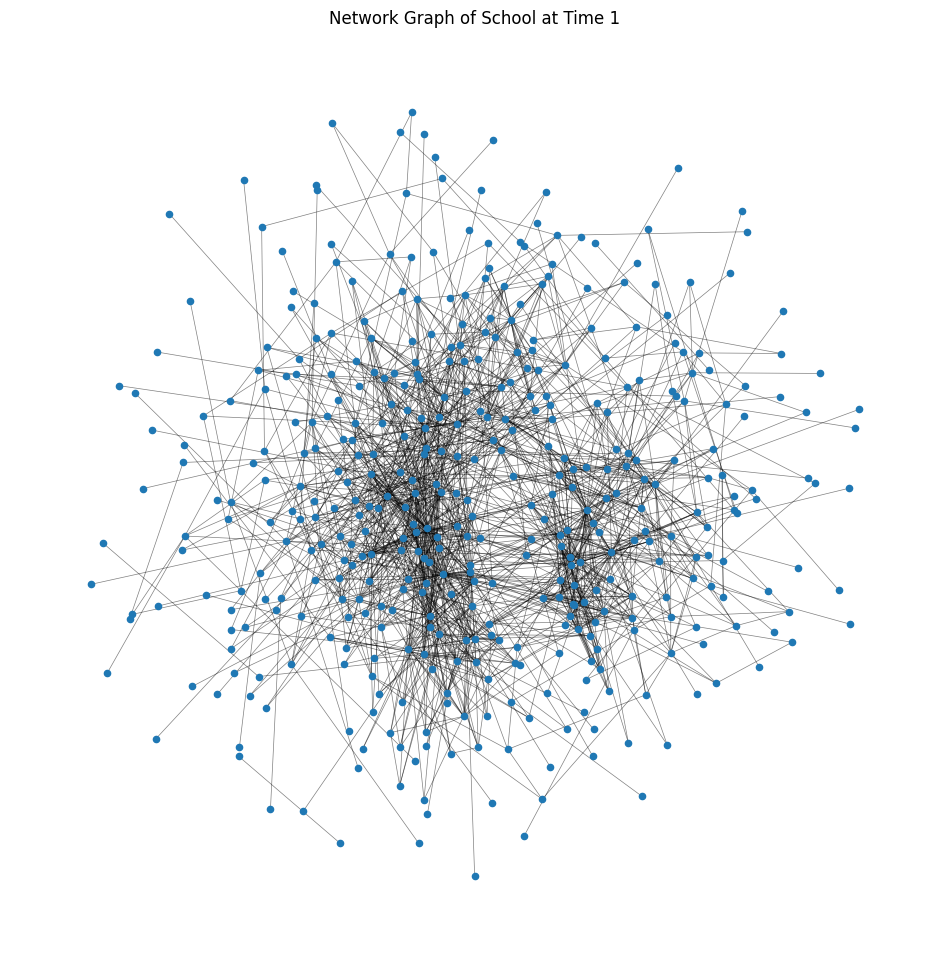

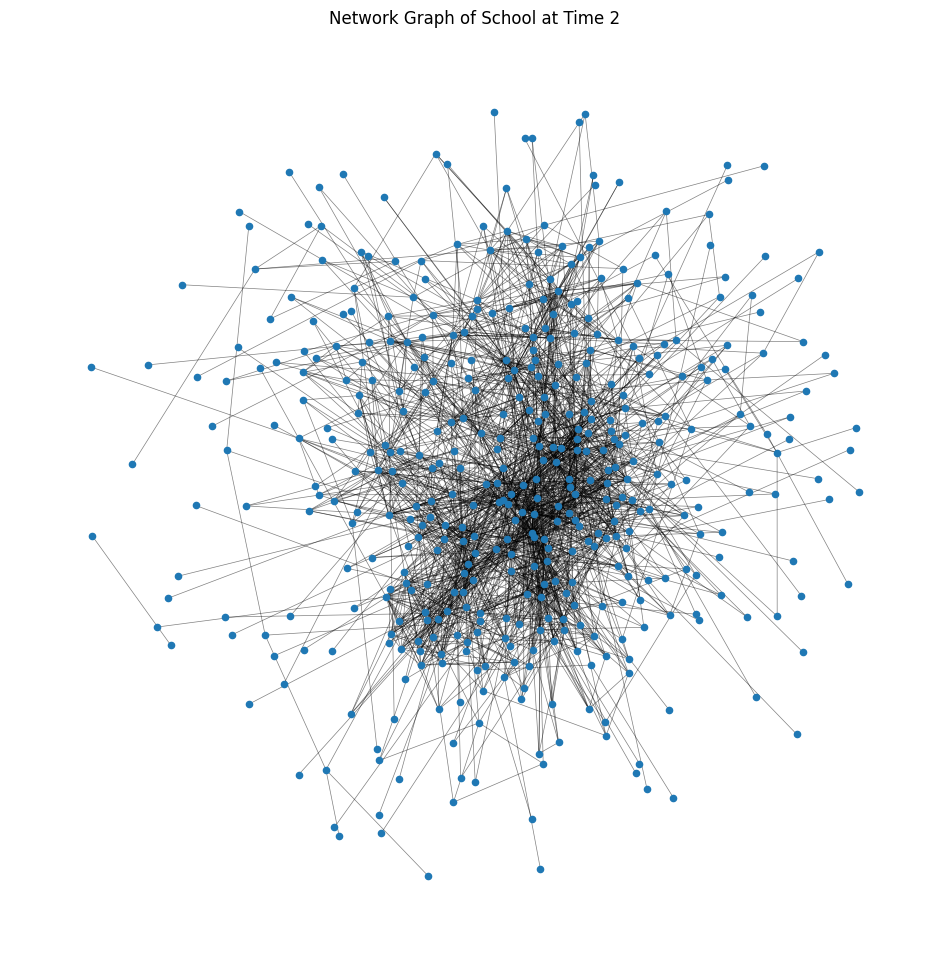

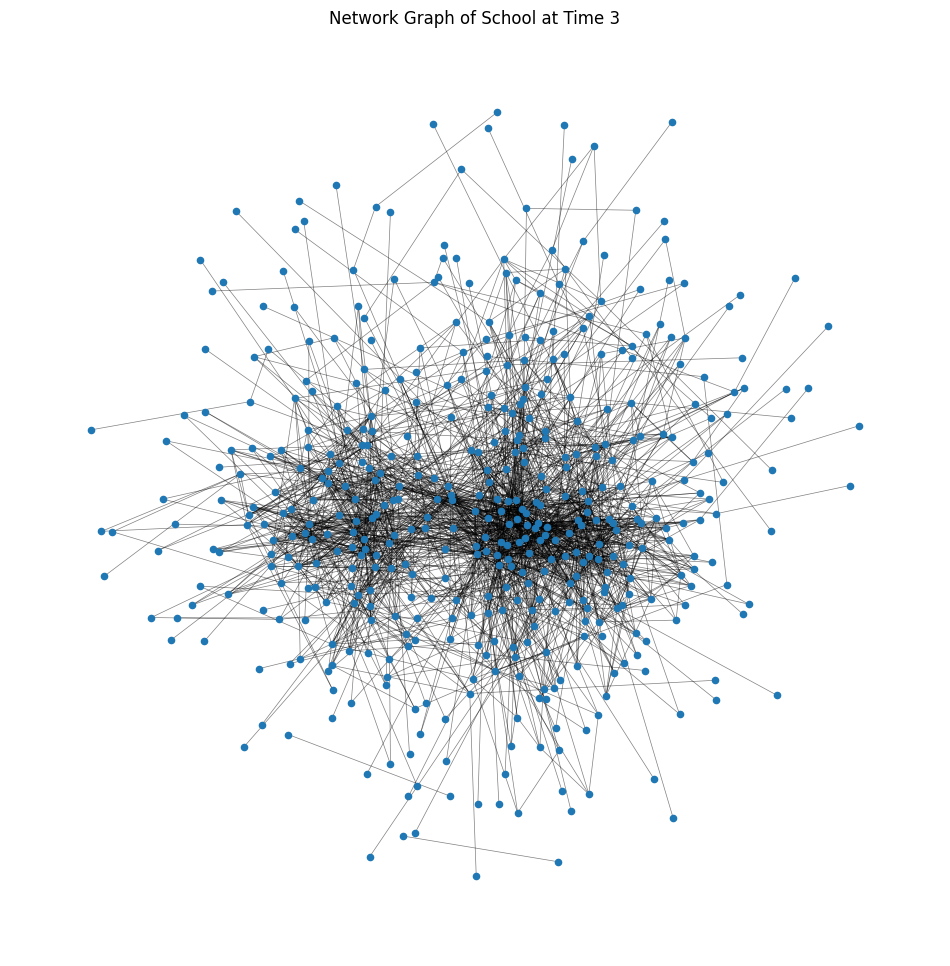

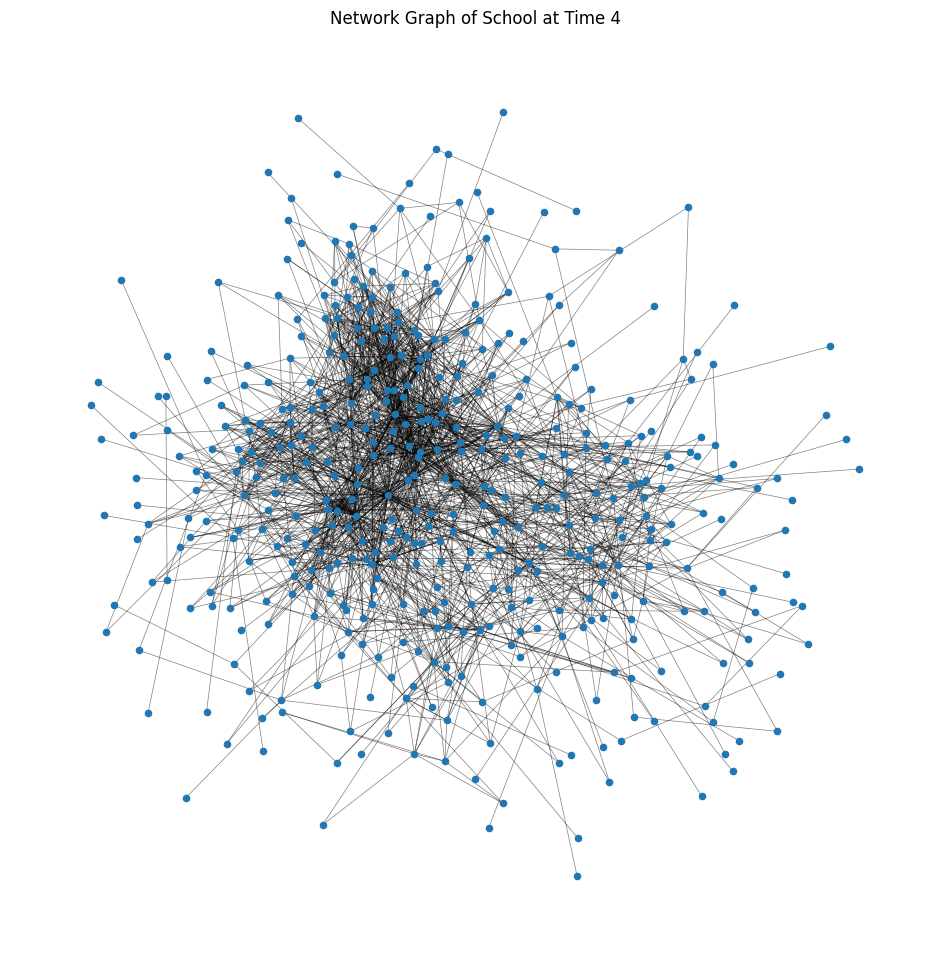

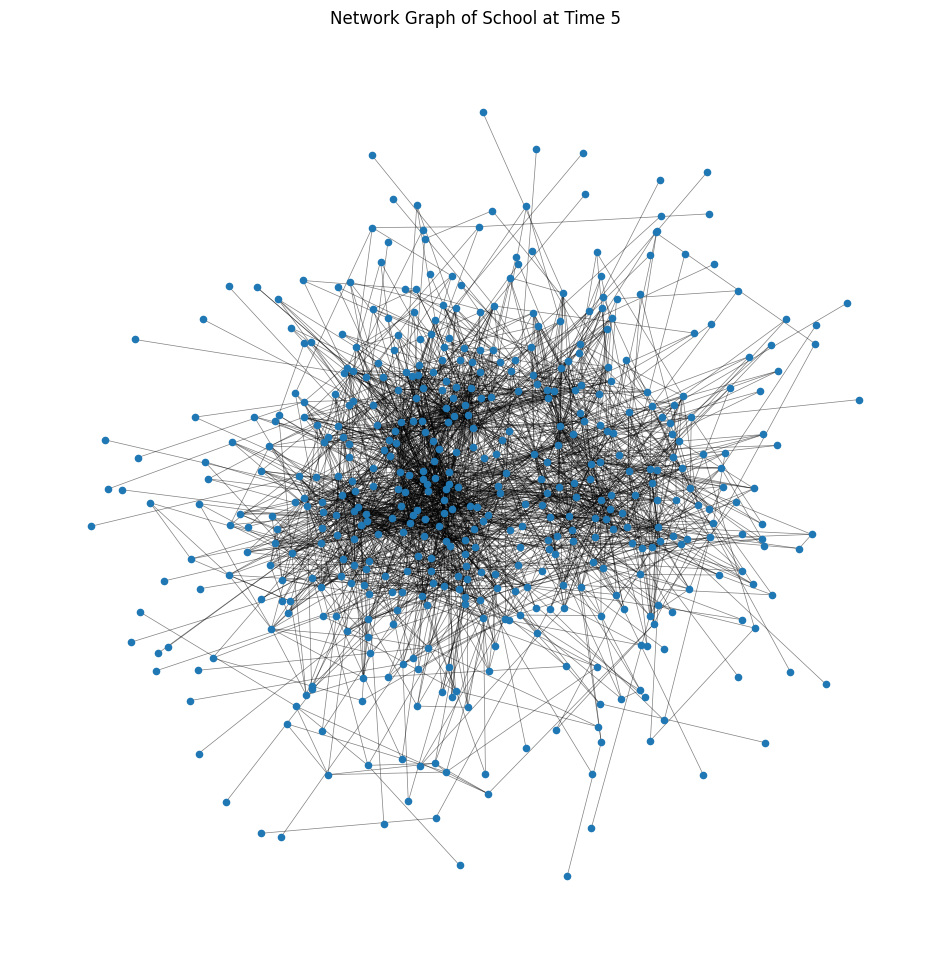

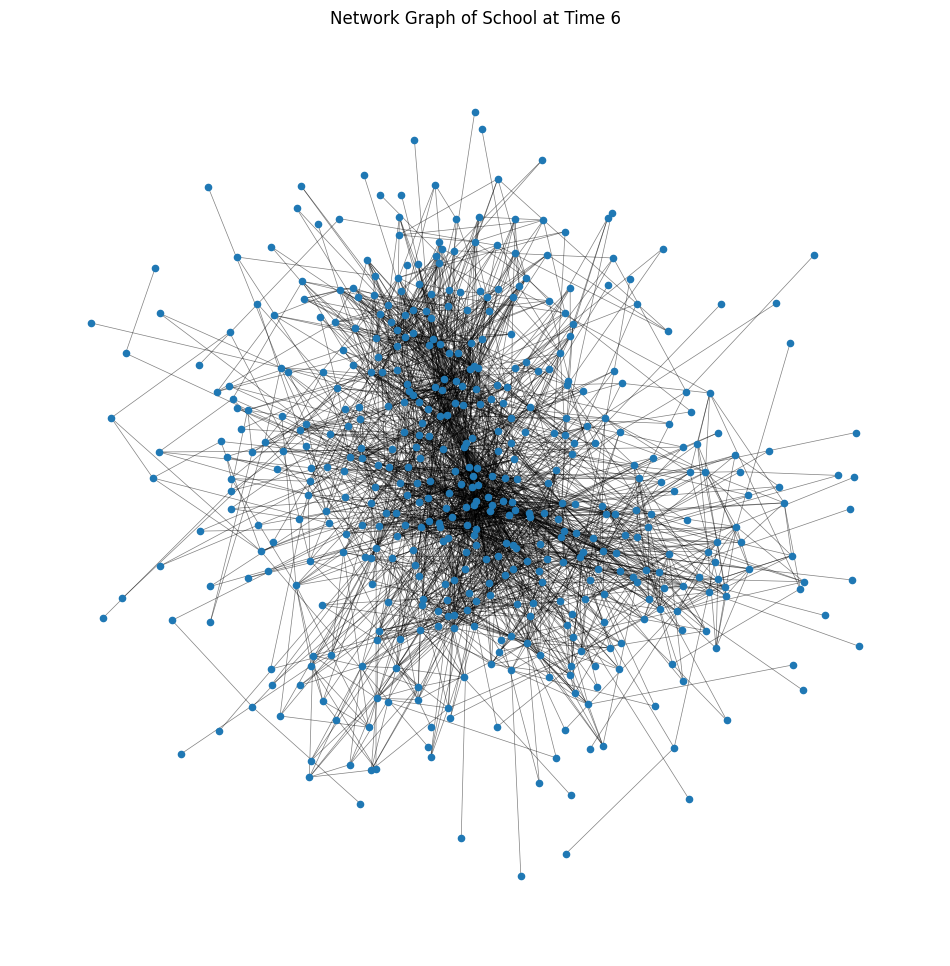

In [7]:
plot_network_from_matrix(networks_school_np['Sheet1'], plot_only_connected_nodes=True, title='Network Graph of School at Time 1')
plot_network_from_matrix(networks_school_np['Sheet2'], plot_only_connected_nodes=True, title='Network Graph of School at Time 2')
plot_network_from_matrix(networks_school_np['Sheet3'], plot_only_connected_nodes=True, title='Network Graph of School at Time 3')
plot_network_from_matrix(networks_school_np['Sheet4'], plot_only_connected_nodes=True, title='Network Graph of School at Time 4')
plot_network_from_matrix(networks_school_np['Sheet5'], plot_only_connected_nodes=True, title='Network Graph of School at Time 5')
plot_network_from_matrix(networks_school_np['Sheet6'], plot_only_connected_nodes=True, title='Network Graph of School at Time 6')

### Extract the adjeacency list for visualizations on Flourish

The interactive graph can be viewed here: https://public.flourish.studio/visualisation/17647342/

In [8]:
adjacency_matrix_to_list_and_save(networks_school_np['Sheet1'], filename="adjacency_list.csv", students_file="students_list.csv")

Adjacency list saved to adjacency_list.csv
Students list saved to students_list.csv


### Load the GPA data and visualize the network

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.


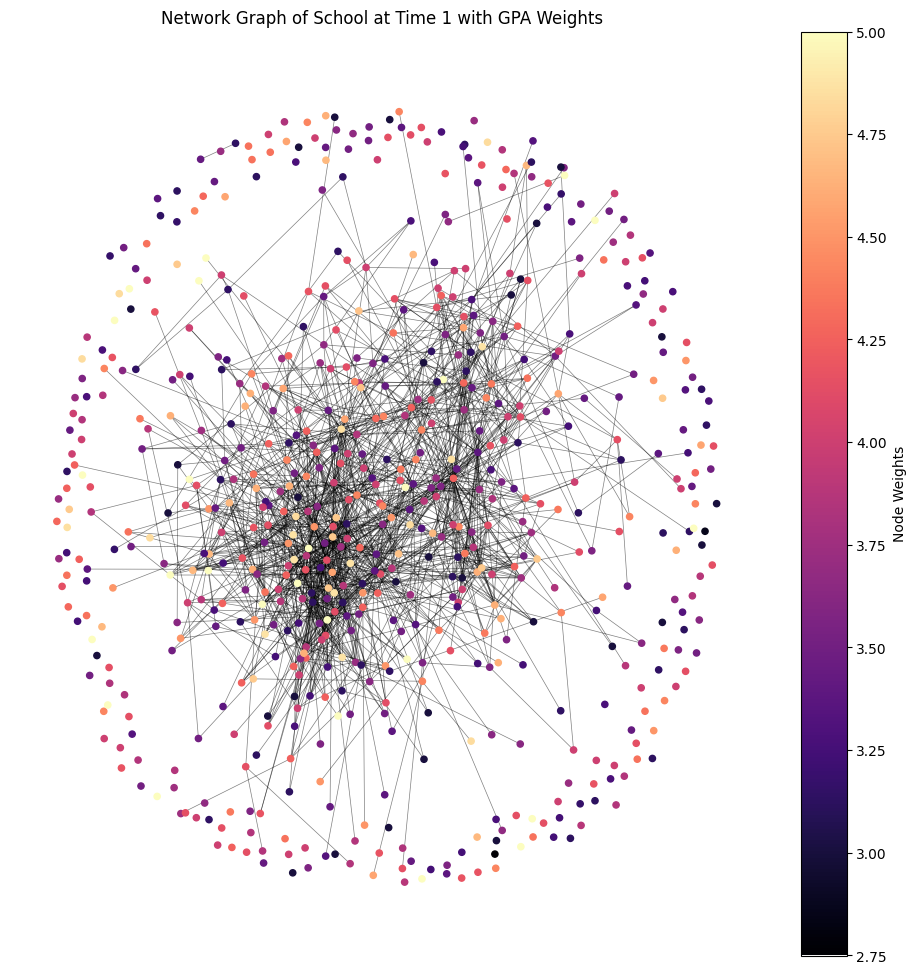

In [8]:
# Load the gpa data
gpa_data = pd.read_excel('./data/gpa_school.xlsx', header=None)

# Get first column of gpa data (Time 1)
gpa_data_1 = gpa_data[0].to_numpy()

# Plot network graph with gpa weights
plot_network_from_matrix(networks_school_np['Sheet1'], plot_only_connected_nodes=False, title='Network Graph of School at Time 1 with GPA Weights', node_weights=gpa_data_1)

### Find the top 10 nodes by in and out-degree centrality

In [9]:
# Perform network analysis of in and out-degree centrality
G = nx.from_numpy_array(networks_school_np['Sheet1'], create_using=nx.DiGraph)

# Comute the in-degree and out-degree centrality of each node
in_degree_centrality = nx.in_degree_centrality(G)
out_degree_centrality = nx.out_degree_centrality(G)

# Sort the nodes by in-degree centrality
sorted_in_degree_centrality = {k: v for k, v in sorted(in_degree_centrality.items(), key=lambda item: item[1], reverse=True)}

# Sort the nodes by out-degree centrality
sorted_out_degree_centrality = {k: v for k, v in sorted(out_degree_centrality.items(), key=lambda item: item[1], reverse=True)}

# Print the top 10 nodes by in-degree centrality
print("Top 10 nodes by in-degree centrality:")
for i, (node, centrality) in enumerate(sorted_in_degree_centrality.items()):
    print(f"{i+1}. Node {node}: {centrality:.3f}")
    if i == 9:
        break

# Print the top 10 nodes by out-degree centrality
print("\nTop 10 nodes by out-degree centrality:")
for i, (node, centrality) in enumerate(sorted_out_degree_centrality.items()):
    print(f"{i+1}. Node {node}: {centrality:.3f}")
    if i == 9:
        break

Top 10 nodes by in-degree centrality:
1. Node 17: 0.076
2. Node 126: 0.055
3. Node 582: 0.050
4. Node 61: 0.043
5. Node 56: 0.041
6. Node 2: 0.037
7. Node 146: 0.037
8. Node 18: 0.035
9. Node 33: 0.035
10. Node 111: 0.035

Top 10 nodes by out-degree centrality:
1. Node 40: 0.058
2. Node 3: 0.052
3. Node 126: 0.049
4. Node 649: 0.046
5. Node 96: 0.043
6. Node 19: 0.037
7. Node 60: 0.028
8. Node 239: 0.028
9. Node 47: 0.026
10. Node 115: 0.026


### EDA report on the network

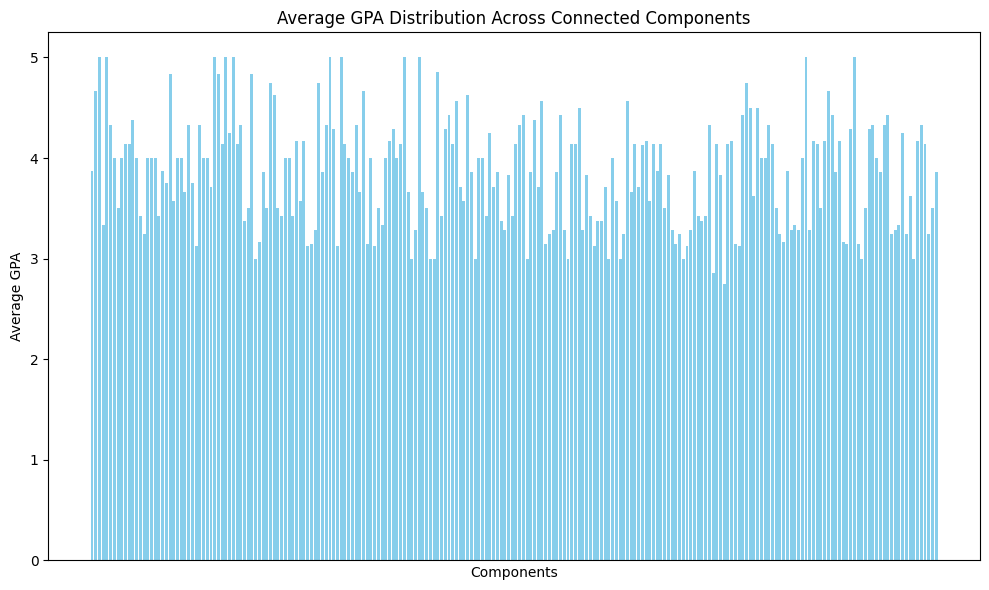

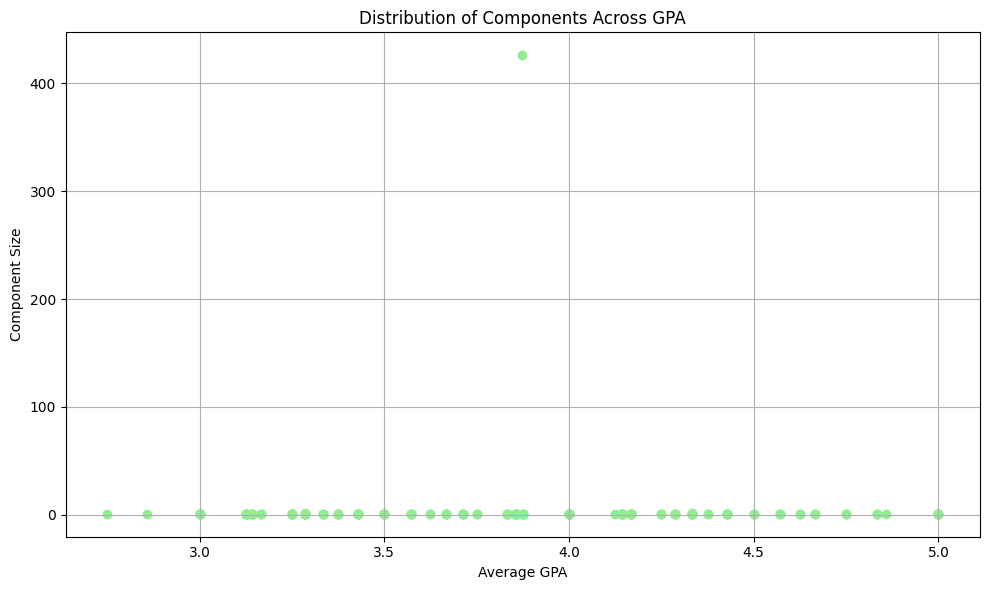

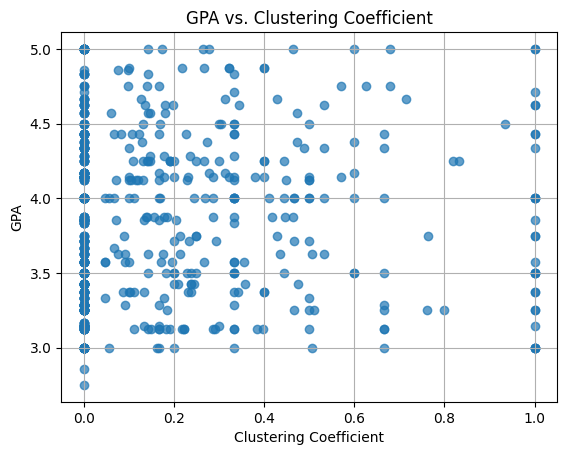

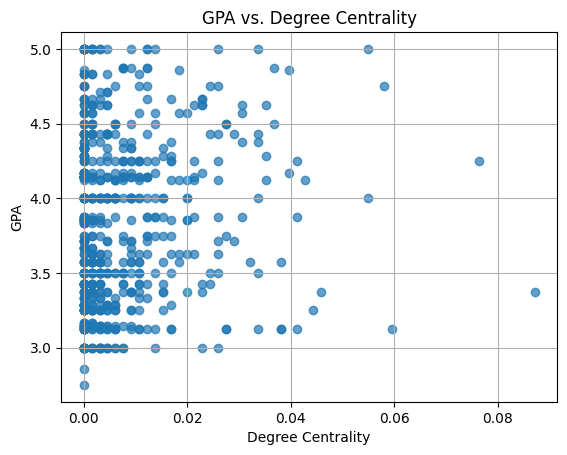

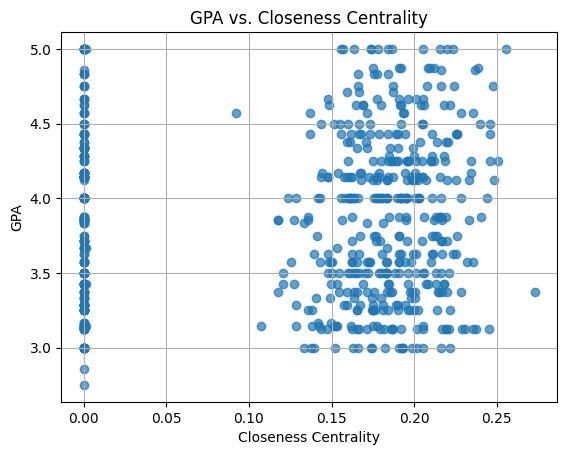

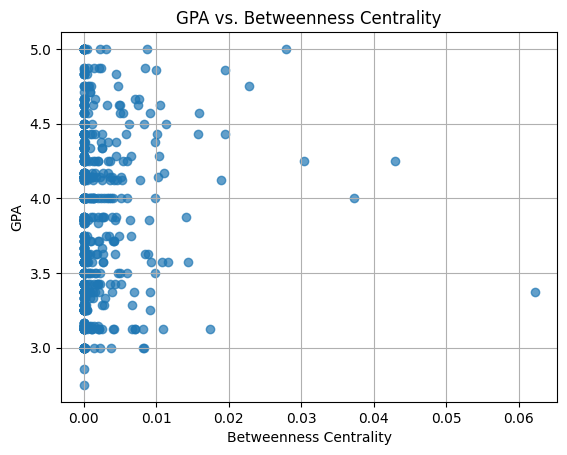

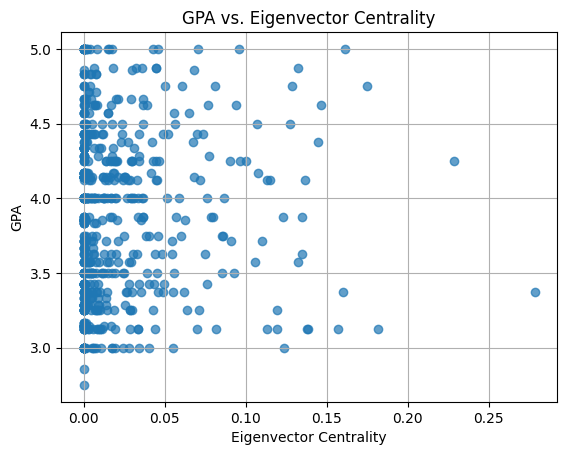

In [10]:
networks_school_report = network_analysis_with_gpa(networks_school_np['Sheet1'], gpa_data_1)

In [11]:
display(networks_school_report)

,GPA,Degree Centrality,Closeness Centrality,Betweenness Centrality,Eigenvector Centrality,Clustering Coefficient,GPA-Weighted Degree Centrality
0,3.375000,0.015291,0.214429,0.003864,4.890358e-02,0.111111,0.051606
1,3.125000,0.027523,0.230731,0.006641,8.171334e-02,0.111111,0.086009
2,4.125000,0.042813,0.248145,0.018885,1.150647e-01,0.105820,0.176606
3,5.000000,0.055046,0.255490,0.027868,1.611628e-01,0.142857,0.275229
4,3.500000,0.033639,0.212941,0.009889,3.926836e-02,0.229437,0.117737
...,...,...,...,...,...,...,...
650,4.142857,0.000000,0.000000,0.000000,7.439509e-48,0.000000,0.000000
651,3.500000,0.004587,0.172078,0.000106,4.816372e-03,0.333333,0.016055
652,3.250000,0.000000,0.000000,0.000000,7.439509e-48,0.000000,0.000000
653,3.500000,0.000000,0.000000,0.000000,7.439509e-48,0.000000,0.000000


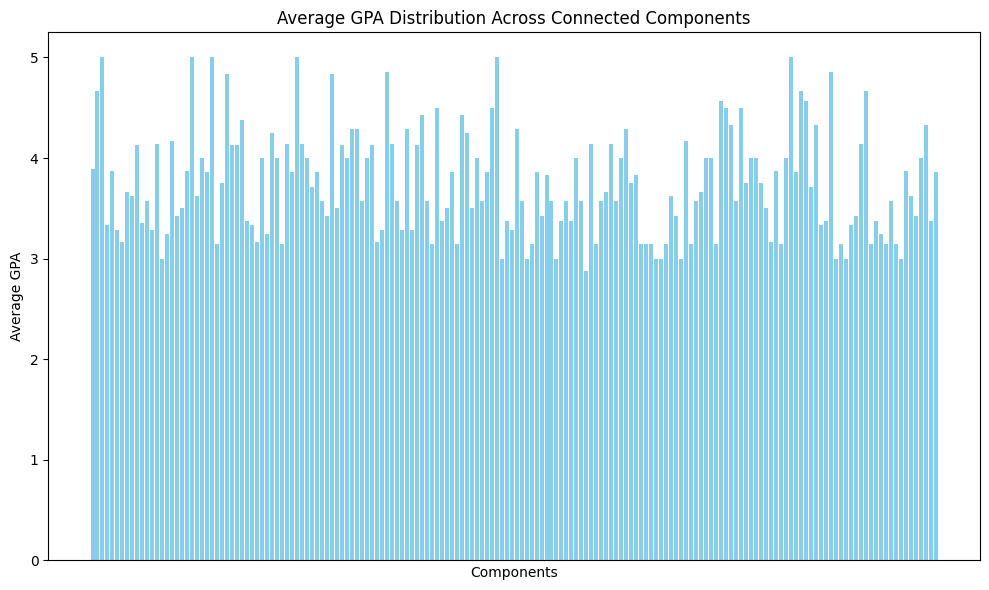

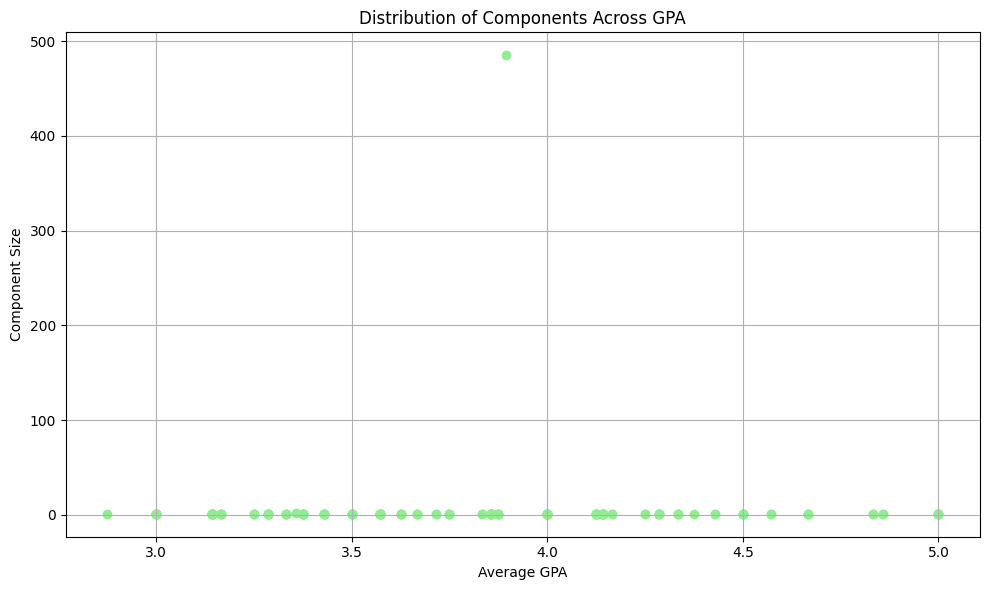

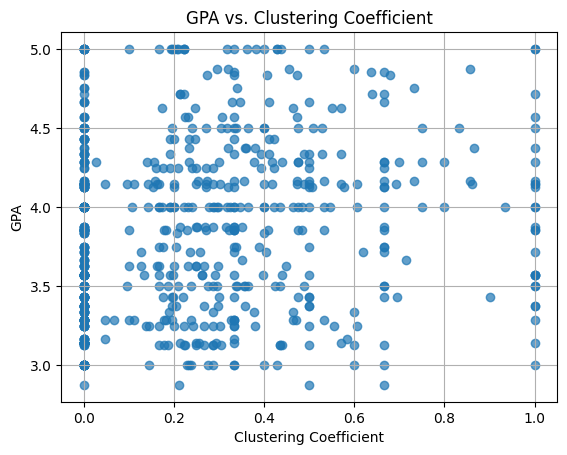

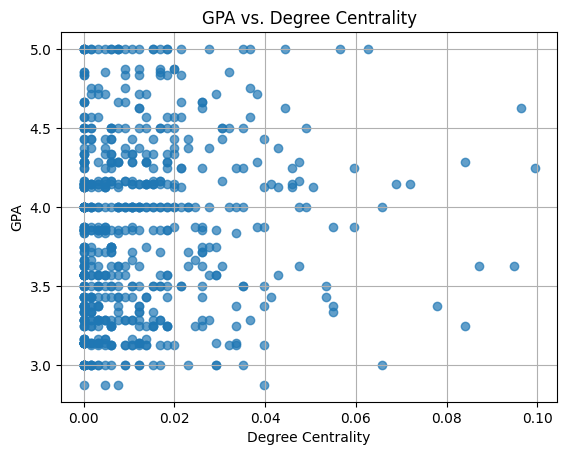

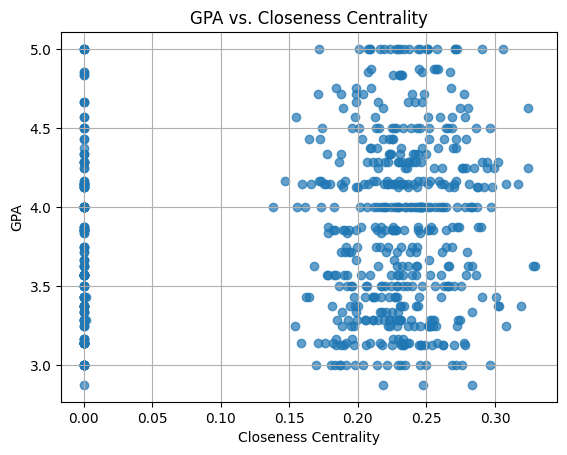

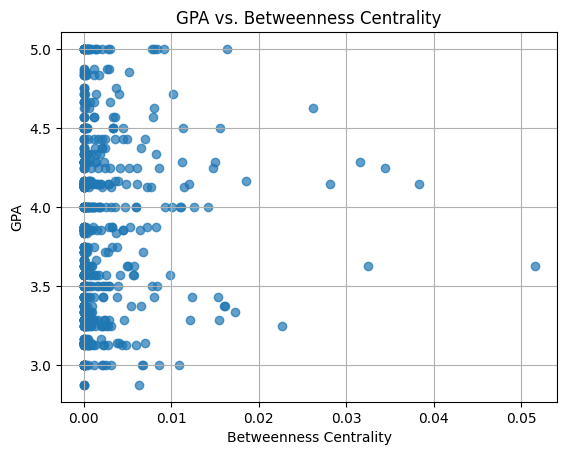

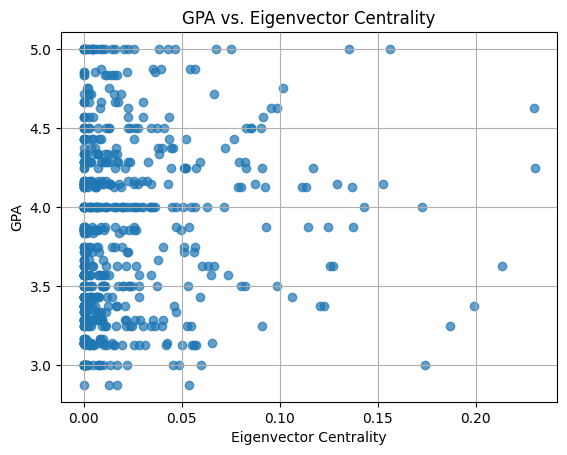

In [12]:
# Get gpa data from Time 6
gpa_data_6 = gpa_data[5].to_numpy()

networks_school_report = network_analysis_with_gpa(networks_school_np['Sheet6'], gpa_data_6)

### Reciprocity score

In [13]:
G = nx.from_numpy_array(networks_school_np['Sheet1'], create_using=nx.DiGraph)
reciprocity = nx.reciprocity(G)
print(f"Reciprocity: {reciprocity}")

Reciprocity: 0.21399652978600348


### Finding Communities in the network using Greedy Modulatrity Communities Method

In [14]:
gpa_data_all = pd.read_excel('./data/gpa_school.xlsx', header=None)

In [15]:
G = nx.from_numpy_array(networks_school_np['Sheet6'], create_using=nx.DiGraph)

# Add gpa attribute to each node of G from the 6th column of gpa_data_all
gpa_values = gpa_data_all.iloc[:, 5].values
for i, gpa in enumerate(gpa_values):
    G.nodes[i]['gpa'] = gpa

In [16]:
# Apply clustering algorithm on the full network based on GPA
communities_gpa = nx.algorithms.community.greedy_modularity_communities(G, weight='gpa')

# Print the communities
for i, community in enumerate(communities_gpa):
    if len(community) > 3:  # Check if the community has more than three nodes
        print(f"Community {i+1}: {community}")

Community 1: frozenset({513, 514, 520, 521, 522, 523, 13, 526, 531, 532, 534, 537, 538, 546, 554, 559, 560, 48, 563, 574, 577, 603, 604, 606, 607, 608, 96, 617, 106, 625, 626, 629, 630, 118, 632, 633, 635, 126, 127, 137, 650, 148, 152, 159, 161, 169, 173, 174, 180, 181, 188, 190, 195, 196, 199, 201, 206, 207, 210, 212, 220, 229, 232, 233, 236, 241, 244, 246, 247, 253, 254, 257, 259, 262, 265, 271, 279, 281, 282, 285, 292, 296, 297, 300, 308, 310, 317, 324, 329, 332, 348, 349, 351, 356, 357, 360, 363, 364, 365, 371, 375, 376, 381, 386, 387, 390, 392, 393, 394, 398, 405, 411, 413, 414, 415, 417, 418, 424, 428, 429, 431, 434, 435, 442, 450, 458, 459, 465, 466, 468, 470, 475, 478, 480, 481, 482, 491, 494})
Community 2: frozenset({0, 1, 2, 3, 5, 6, 9, 11, 15, 275, 19, 277, 22, 23, 24, 280, 539, 27, 30, 287, 32, 36, 37, 40, 41, 301, 305, 306, 307, 565, 313, 315, 316, 60, 63, 321, 69, 70, 583, 582, 584, 72, 331, 328, 588, 589, 79, 337, 594, 81, 83, 85, 343, 88, 345, 89, 344, 350, 97, 98, 355,

In [17]:
# Calculate and print average GPAs of all the communities
for i, community in enumerate(communities_gpa):
    if len(community) > 3:  # Check if the community has more than three nodes
        gpa_values = [G.nodes[node]['gpa'] for node in community]
        avg_gpa = sum(gpa_values) / len(gpa_values)
        print(f"Average GPA of Community {i+1}: {avg_gpa}")

Average GPA of Community 1: 3.8345841959972384
Average GPA of Community 2: 3.9375513136289
Average GPA of Community 3: 3.99618149146451
Average GPA of Community 4: 3.811920222634508
Average GPA of Community 5: 3.886607142857143
Average GPA of Community 6: 3.7755102040816326
Average GPA of Community 7: 4.2857142857142865
Average GPA of Community 8: 3.9563492063492056
Average GPA of Community 9: 3.473214285714286


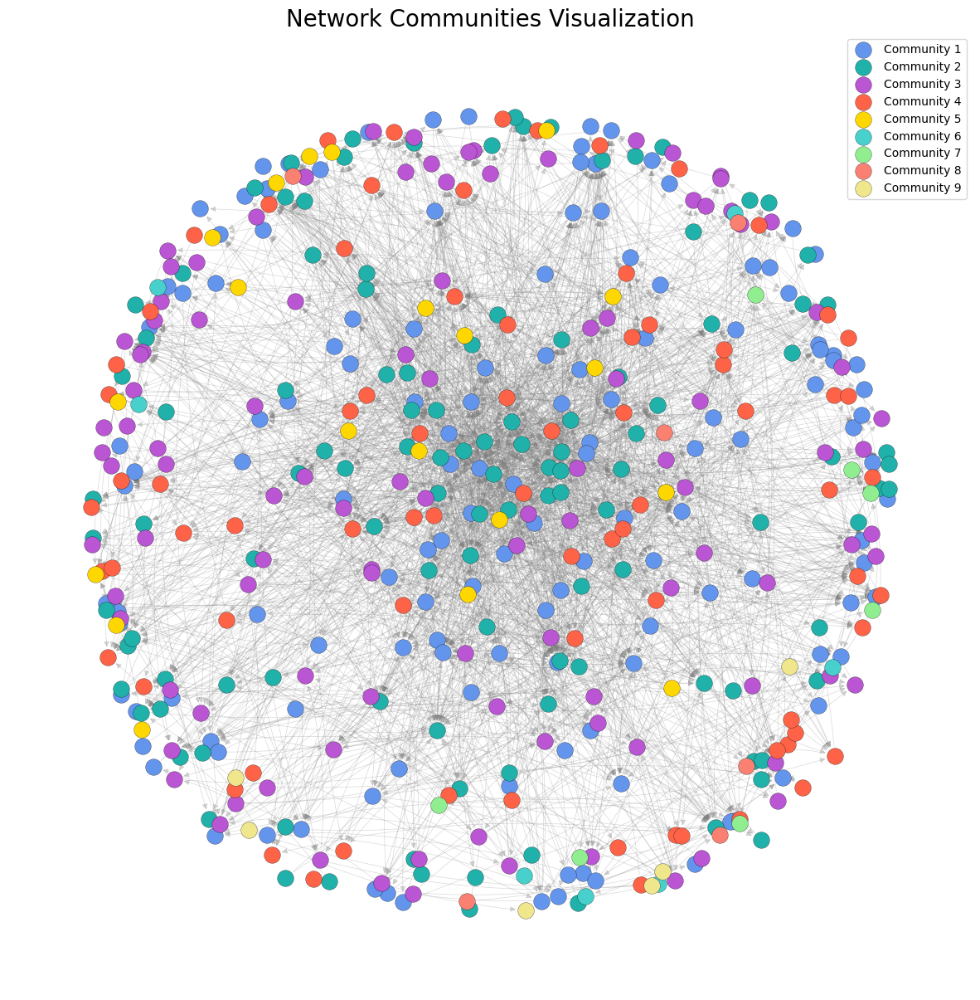

In [18]:
colors = ['cornflowerblue', 'lightseagreen', 'mediumorchid', 'tomato', 'gold', 'mediumturquoise', 'lightgreen', 'salmon', 'khaki', 'thistle'] * (len(communities_gpa) // 10) + ['cornflowerblue', 'lightseagreen', 'mediumorchid', 'tomato', 'gold', 'mediumturquoise', 'lightgreen', 'salmon', 'khaki', 'thistle'][:len(communities_gpa) % 10]

# Initialize a figure
plt.figure(figsize=(15, 15))

# Position nodes using a layout
# The 'k' parameter determines the optimal distance between nodes. 
# By adjusting this parameter, you can ensure that the nodes are spread out in a way that minimizes overlap.
pos = nx.spring_layout(G, scale=2, k=0.7)  # Increase scale to make nodes spread out

# Draw each community with different colors, skip single node communities
community_id = 0
for community in communities_gpa:
    if len(community) > 3:  # Check if the community has more than three nodes
        nx.draw_networkx_nodes(G, pos,
                                nodelist=list(community),
                                node_color=colors[community_id],
                                node_size=200,
                                edgecolors='black',
                                linewidths=0.2,
                                label=f'Community {community_id+1}')  # Add label for legend
        nx.draw_networkx_edges(G, pos,
                                edgelist=[(u, v) for u, v in G.edges() if u in community and v in community],
                                width=0.5,
                                alpha=0.3,
                                edge_color='gray',  # Change edge color to gray
                                arrows=True,  # Add arrows
                                connectionstyle='arc3, rad = 0.1')
        community_id += 1  # Increment community_id only if it's drawn

# Remove the axis
plt.axis('off')

# Add legend
plt.legend()

plt.title("Network Communities Visualization", fontsize=20)

# Show plot
plt.show()

### HITS (Hyperlink-Induced Topic Search) Algorithm on Communities

Community 1:
HUB: Node 96 with hub score 0.0409
AUTHORITY: Node 169 with authority score 0.0399




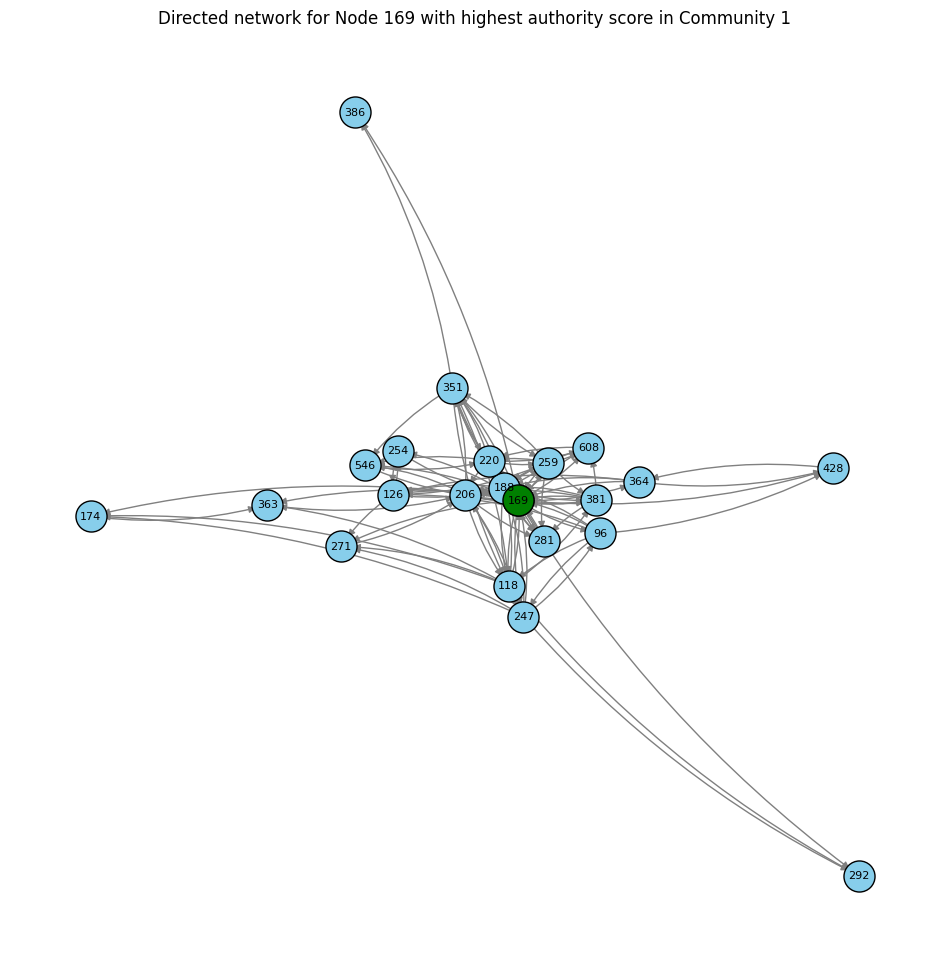

Community 2:
HUB: Node 40 with hub score 0.0447
AUTHORITY: Node 98 with authority score 0.0392




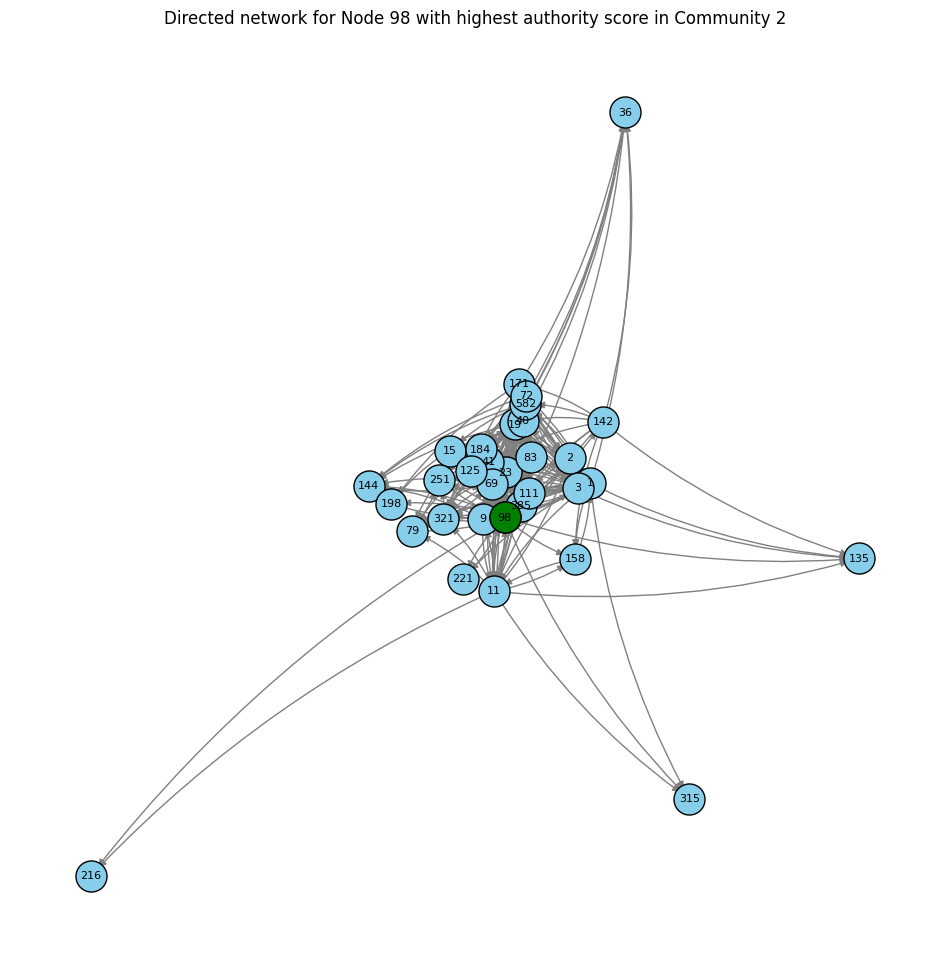

Community 3:
HUB: Node 38 with hub score 0.0563
AUTHORITY: Node 28 with authority score 0.0470




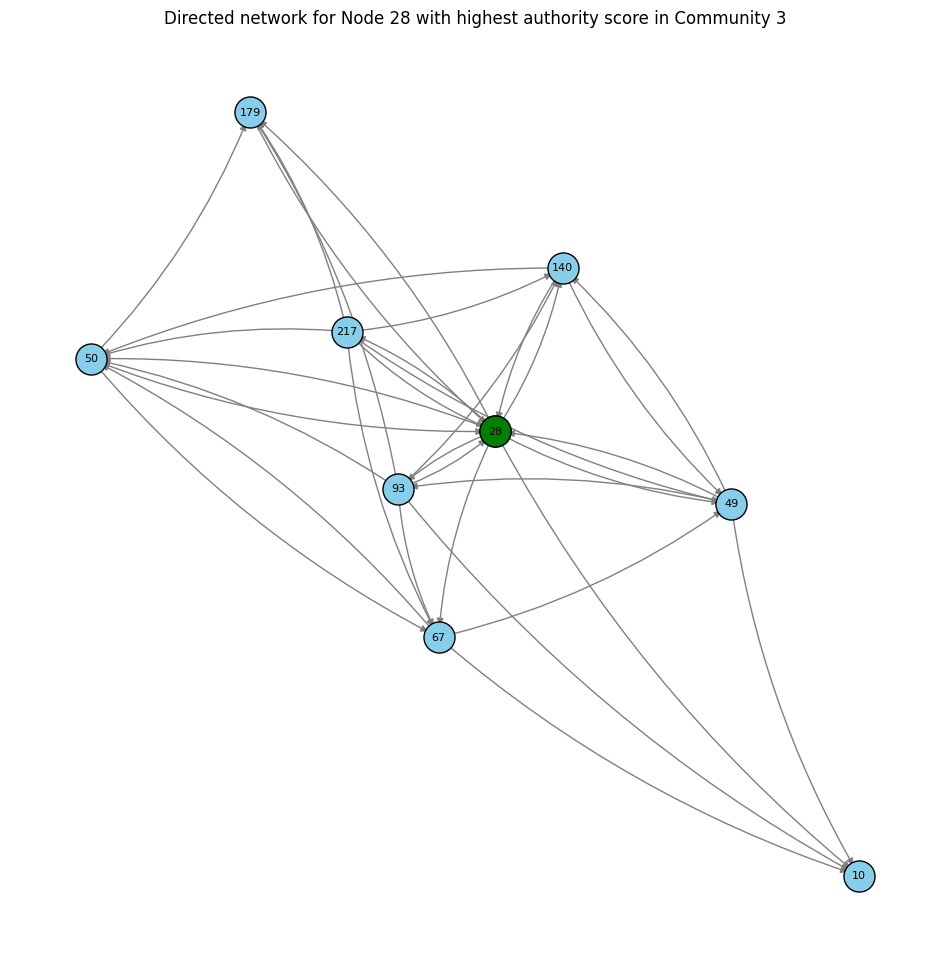

Community 4:
HUB: Node 45 with hub score 0.0540
AUTHORITY: Node 33 with authority score 0.0505




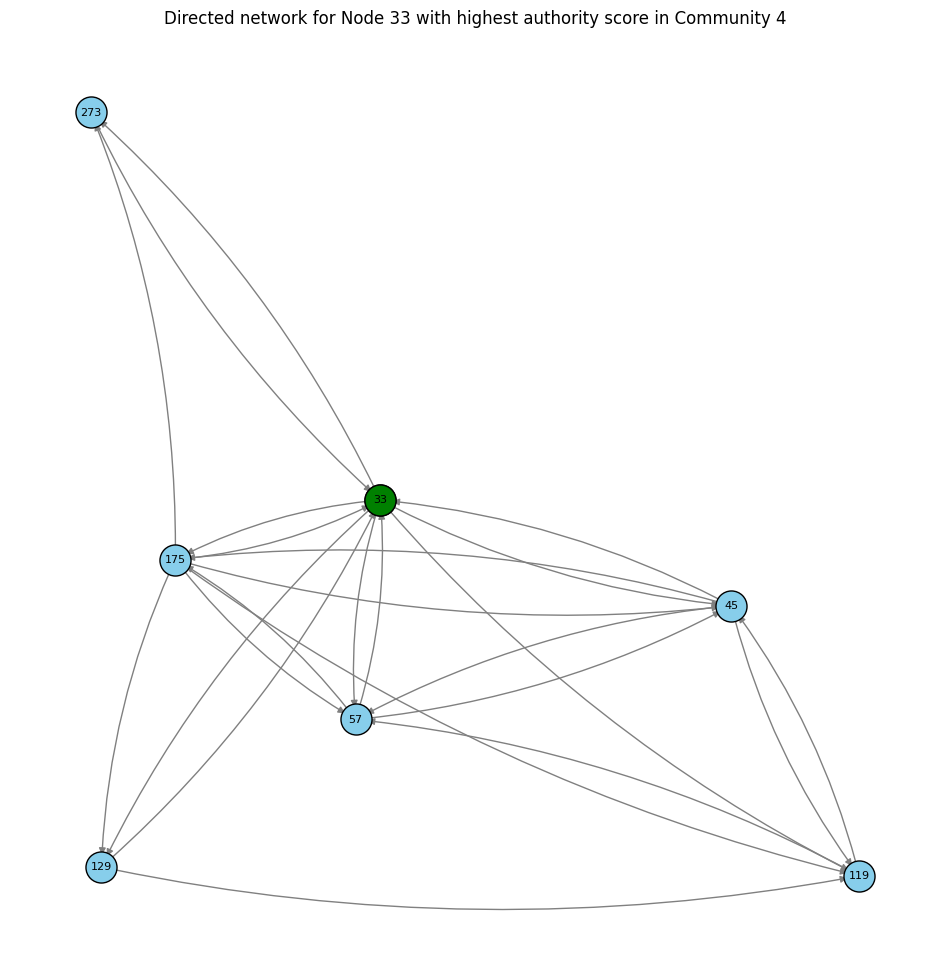

Community 5:
HUB: Node 380 with hub score 0.0903
AUTHORITY: Node 408 with authority score 0.1672




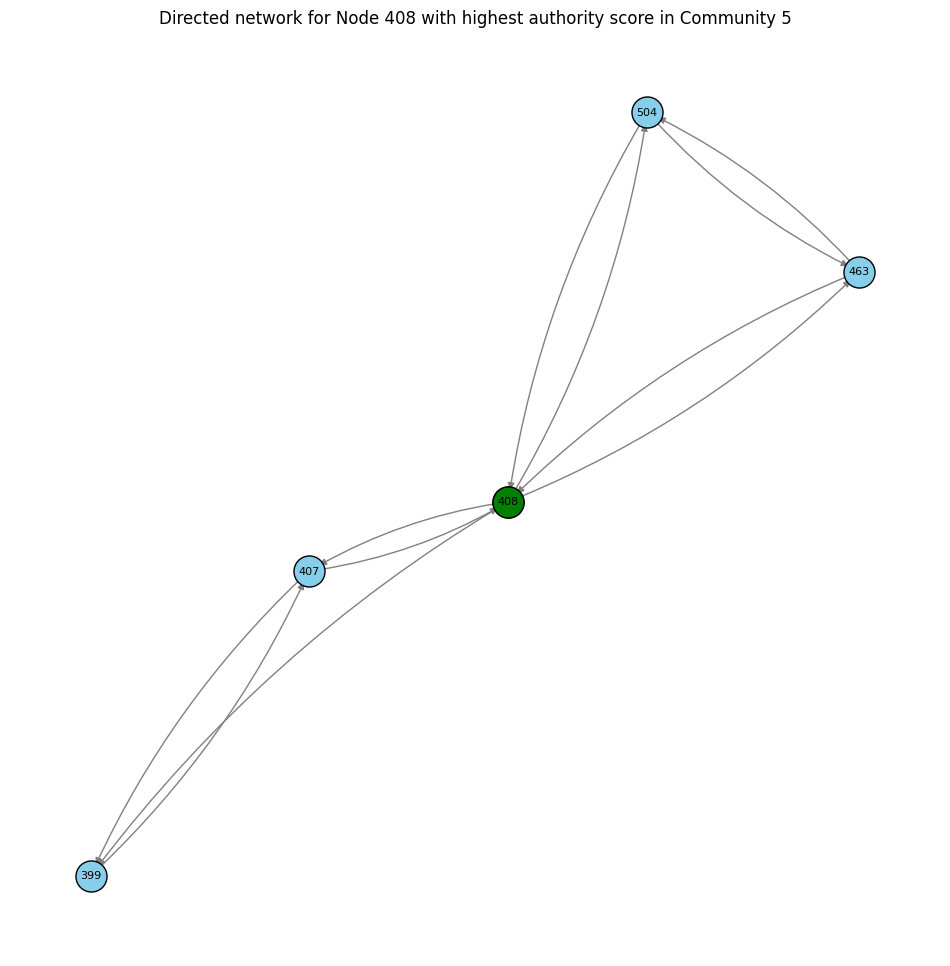

Community 6:
HUB: Node 467 with hub score 0.2078
AUTHORITY: Node 224 with authority score 0.3111




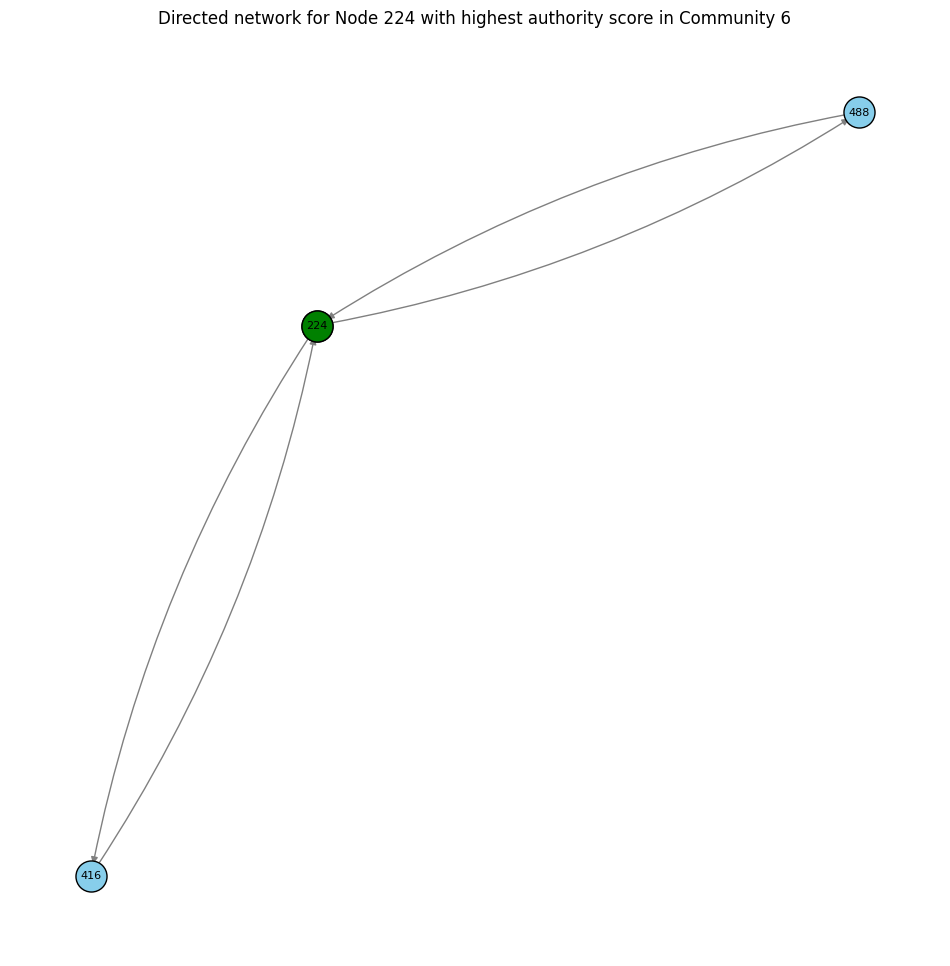

Community 7:
HUB: Node 323 with hub score 0.2217
AUTHORITY: Node 601 with authority score 0.2822




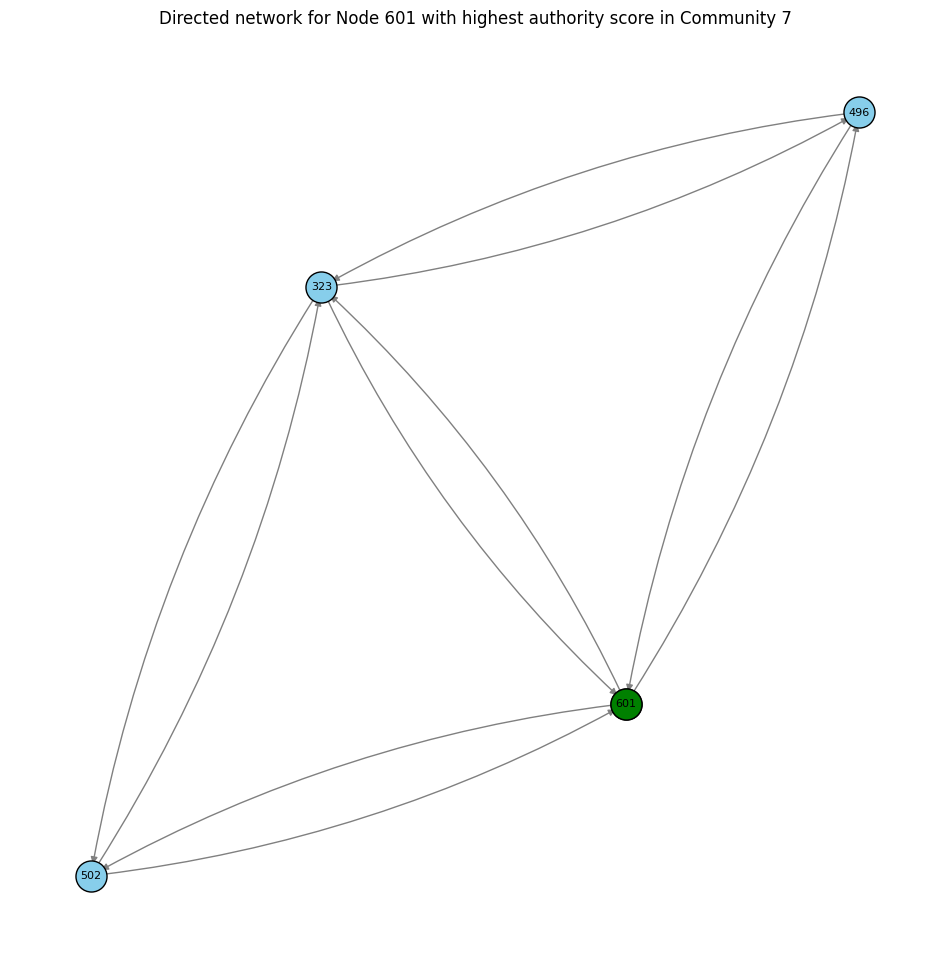

Community 8:
HUB: Node 616 with hub score 0.3799
AUTHORITY: Node 412 with authority score 0.7599




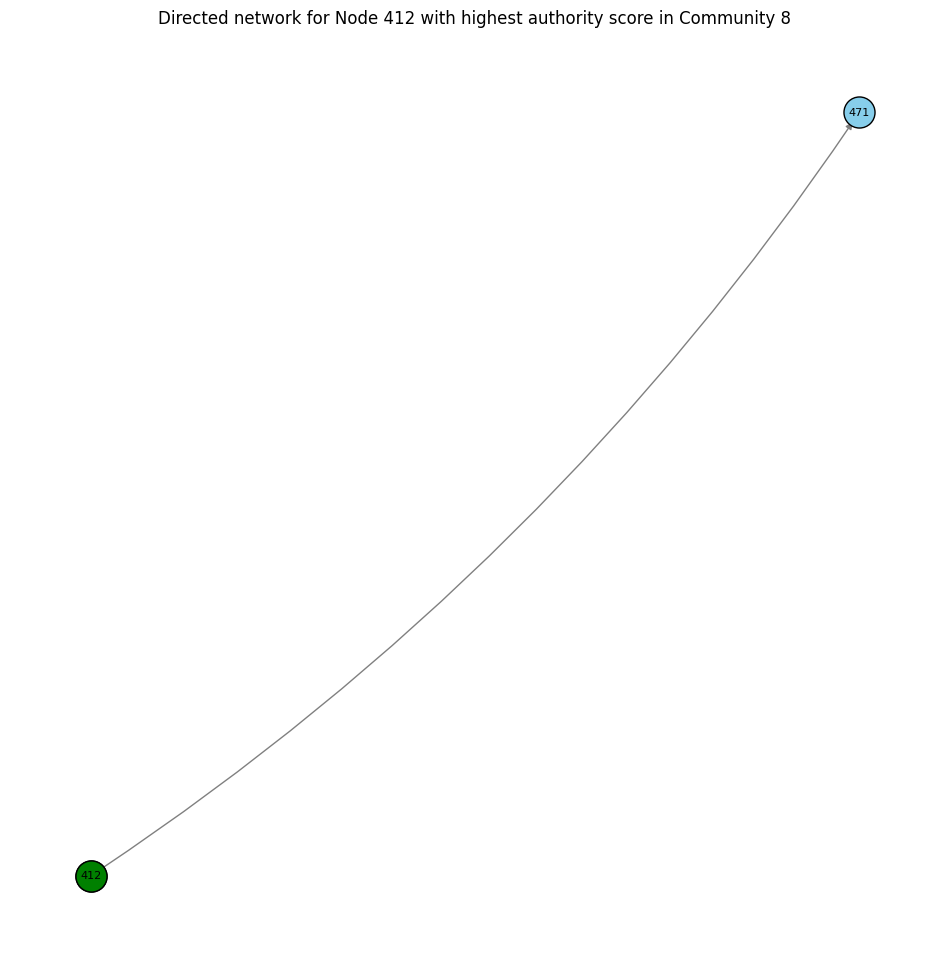

Community 9:
HUB: Node 642 with hub score 0.3660
AUTHORITY: Node 202 with authority score 0.5774




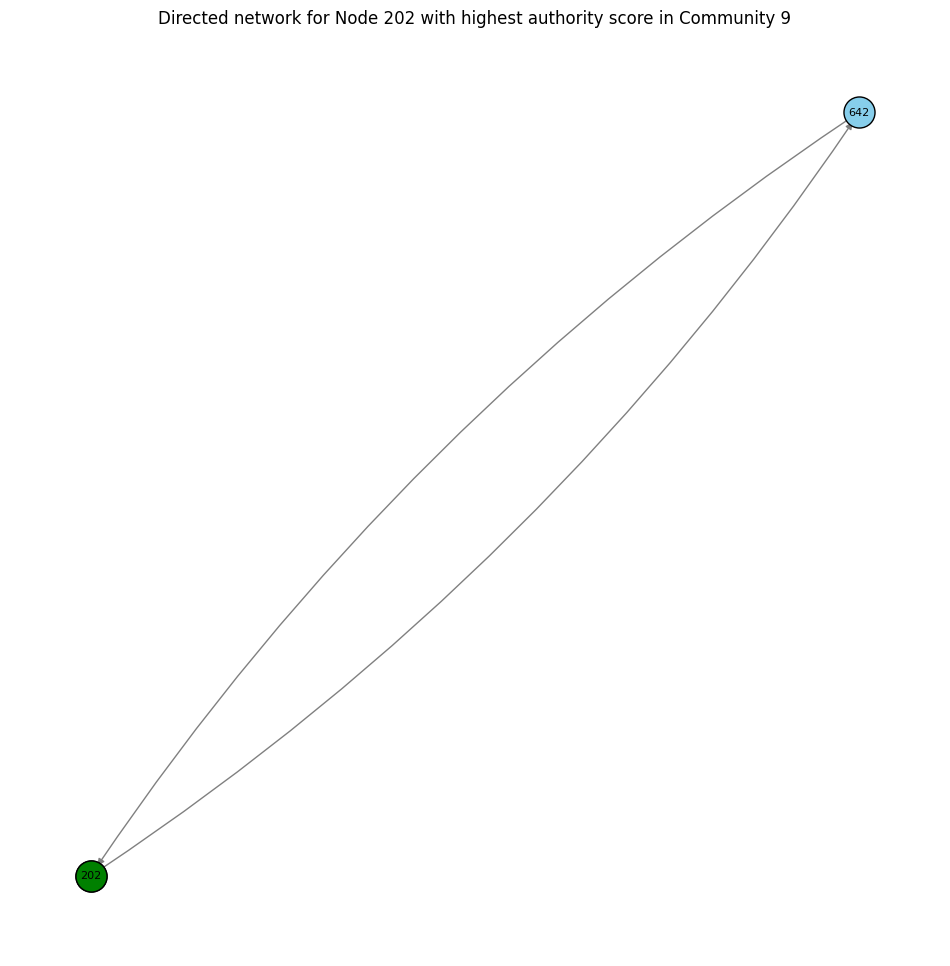

In [19]:
# Perform HITS algorithm to compute hubs and authorities scores for each community
for community_id, community in enumerate(communities_gpa):
    if len(community) > 3:
        # Create a subgraph for the current community
        G_sub = G.subgraph(community)

        # Compute HITS scores for the subgraph
        hubs, authorities = nx.hits(G_sub)

        # Sort nodes based on hubs score in descending order
        sorted_hubs = sorted(hubs.items(), key=lambda x: x[1], reverse=True)

        # Sort nodes based on authorities score in descending order
        sorted_authorities = sorted(authorities.items(), key=lambda x: x[1], reverse=True)

        # Display top hub for the current community
        top_hub_node, top_hub_score = sorted_hubs[0]
        print("Community " + str(community_id+1) + ":")
        print(f"HUB: Node {top_hub_node} with hub score {top_hub_score:.4f}")

        # Display top authority for the current community
        top_authority_node, top_authority_score = sorted_authorities[0]
        print(f"AUTHORITY: Node {top_authority_node} with authority score {top_authority_score:.4f}")
        print("\n")

        # Create a subgraph for the node with the highest authority score and its neighbors
        G_authority = G_sub.subgraph([n for n in G_sub.neighbors(top_authority_node)] + [top_authority_node])

        # Create a spring layout for the nodes
        pos = nx.spring_layout(G_authority, scale=3)  # Increase scale to make nodes spread out

        # Increase the figure size for better visibility
        plt.figure(figsize=(12, 12))

        nx.draw_networkx_nodes(G_authority, pos, node_color='skyblue', node_size=500, edgecolors='black')

        nx.draw_networkx_labels(G_authority, pos, font_size=8)
        nx.draw_networkx_edges(G_authority, pos, edge_color='gray', arrows=True, connectionstyle='arc3, rad = 0.1')
        nx.draw_networkx_nodes(G_authority, pos, nodelist=[top_authority_node], node_color='green', node_size=500, edgecolors='black')
        plt.title(f"Directed network for Node {top_authority_node} with highest authority score in Community {community_id+1}")
        plt.axis('off')
        plt.show()
        

### Random Forest Regression to predict GPA based on centrality

Mean Squared Error: 0.32593669336508535
Feature Importances:
Closeness Centrality: 0.27541245701788614
Eigenvector Centrality: 0.23321563145522362
Clustering Coefficient: 0.2080925972895683
Betweenness Centrality: 0.17531275959584483
Degree Centrality: 0.10796655464147716


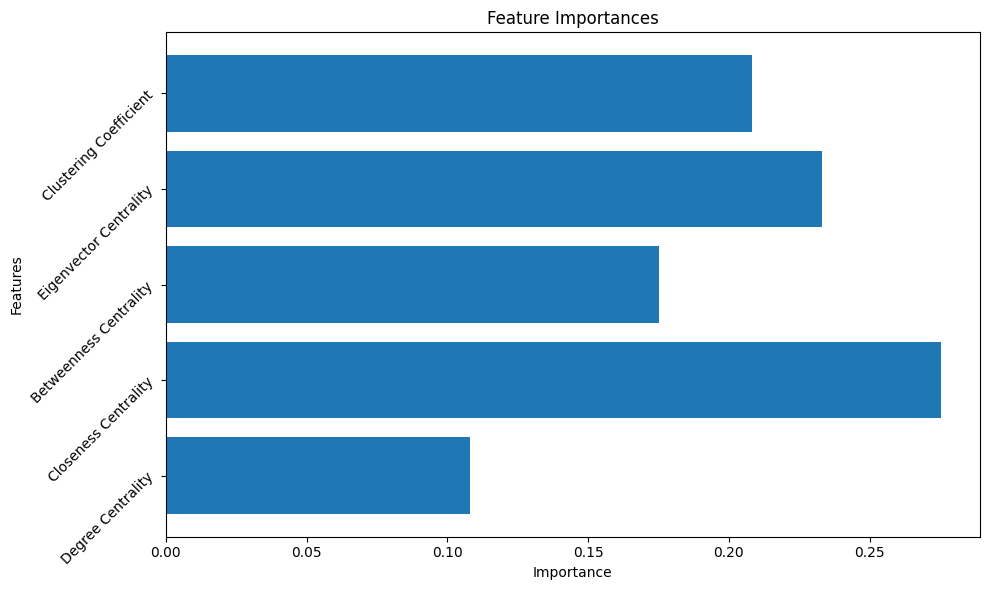

In [20]:
# Prepare the data
X = networks_school_report.drop(columns=['GPA', 'GPA-Weighted Degree Centrality'], axis=1)
y = networks_school_report['GPA']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize the model
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model
rf.fit(X_train, y_train)

# Make predictions
y_pred = rf.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

# Feature importance
feature_importances = rf.feature_importances_
importance_dict = dict(zip(X.columns, feature_importances))
sorted_importance = sorted(importance_dict.items(), key=lambda item: item[1], reverse=True)
print("Feature Importances:")
for feature, importance in sorted_importance:
    print(f"{feature}: {importance}")

# Plot the feature importances in a horizontal bar chart
plt.figure(figsize=(10, 6))
plt.barh(range(len(feature_importances)), feature_importances, tick_label=X.columns)
plt.ylabel('Features')
plt.xlabel('Importance')
plt.title('Feature Importances')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

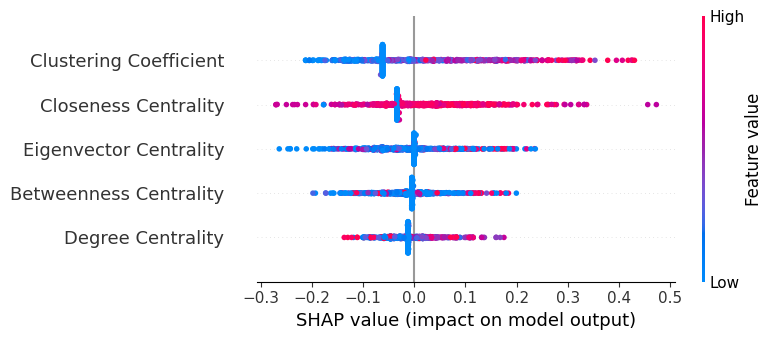

In [21]:
# Plot SHAP values

# Create an explainer object
explainer = shap.TreeExplainer(rf)

# Calculate SHAP values
shap_values = explainer.shap_values(X)

# Summary plot with color
shap.summary_plot(shap_values, X, plot_type="dot")

# Force plot
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X, link="logit", matplotlib=False)

### Study of homophily

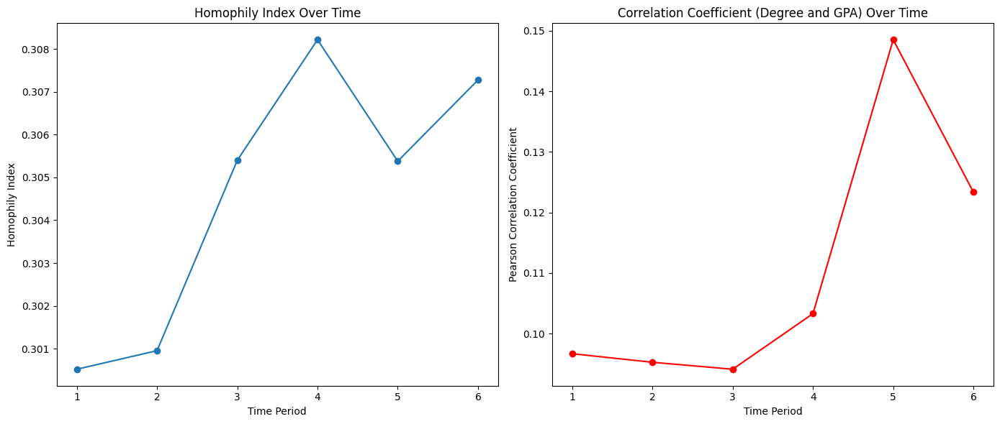

In [22]:
# Function to calculate homophily index
def calculate_homophily(graph, node_attributes):
    same_attr_edges = 0
    total_edges = 0
    for edge in graph.edges():
        if node_attributes[edge[0]] == node_attributes[edge[1]]:
            same_attr_edges += 1
        total_edges += 1
    if total_edges > 0:
        return same_attr_edges / total_edges
    else:
        return 0

# Initialize lists to store results
homophily_indices = []
correlation_coefficients = []

# Load GPA data
gpa_data_all = pd.read_excel('./data/gpa_school.xlsx', header=None)

# Loop through each sheet/time period
for i in range(1, 7):
    sheet_name = f'Sheet{i}'
    adjacency_matrix = networks_school_np[sheet_name]

    # Get GPA data for the current time period
    gpa_data = gpa_data_all[i - 1].values.flatten()  # Ensure gpa_data is correctly indexed

    if i == 1:
        # Normalize GPA data for homophily calculation (discretize)
        gpa_categories = pd.qcut(gpa_data, q=4, labels=False)
        
    # Create graph from adjacency matrix
    G = nx.from_numpy_array(adjacency_matrix)
    
    # Calculate homophily index
    homophily_index = calculate_homophily(G, gpa_categories)
    homophily_indices.append(homophily_index)
    
    # Calculate Pearson correlation coefficient between node degrees and GPA
    degrees = list(nx.degree_centrality(G).values())  # Convert degrees to list for pearsonr compatibility
    correlation_coefficient, _ = pearsonr(degrees, gpa_data)
    correlation_coefficients.append(correlation_coefficient)

# Plotting the results
time_periods = range(1, 7)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(time_periods, homophily_indices, marker='o', linestyle='-')
plt.title('Homophily Index Over Time')
plt.xlabel('Time Period')
plt.ylabel('Homophily Index')

plt.subplot(1, 2, 2)
plt.plot(time_periods, correlation_coefficients, marker='o', linestyle='-', color='r')
plt.title('Correlation Coefficient (Degree and GPA) Over Time')
plt.xlabel('Time Period')
plt.ylabel('Pearson Correlation Coefficient')

plt.tight_layout()
plt.show()

### Homophily testing

In [23]:
# Create a simulation function
def simulate_mixed_edges(data, attribute, id_attr, graph):
    attr_column = data[attribute].sample(frac=1).reset_index(drop=True) # Reshuffle column
    nx.set_node_attributes(graph, dict(zip(data[id_attr], attr_column)), attribute) # Set node attribute
    mixed_edges = len([(s,t) for s,t in graph.edges if graph.nodes[s][attribute] != graph.nodes[t][attribute]]) # Get number of mixed edges
    return mixed_edges

for i in range(1, 7):
    nodes = pd.read_excel("./data/gpa_school.xlsx", header=None)
    sheet_name = f'Sheet{i}'
    adjacency_matrix = networks_school_np[sheet_name]
    G = nx.from_numpy_array(adjacency_matrix)
    nodes = nodes.iloc[:, i-1].to_frame()
    nodes['id'] = range(1, len(nodes) + 1)
    nodes.columns = ['gpa', 'id']
# Normalize GPA data for homophily calculation (discretize)
    gpa_categories = pd.qcut(nodes['gpa'], q=4, labels=False, duplicates='drop')
    nodes['gpa_categories'] = gpa_categories.astype(str)
    # Calculate percentage of male people in the Quaker graph, using pandas
    p1 = nodes.gpa_categories.value_counts()["0"]/nodes.gpa_categories.count()

# Calculate percentage of female people in the Quaker graph, using pandas
    p2 = nodes.gpa_categories.value_counts()["1"]/nodes.gpa_categories.count()

    p3 = nodes.gpa_categories.value_counts()["2"]/nodes.gpa_categories.count()

    p4 = nodes.gpa_categories.value_counts()["3"]/nodes.gpa_categories.count()

    pro = [p1,p2,p3,p4]
    p_Emixed_edges = 2*sum(pro[x] * pro[y] for x in range(len(pro)) for y in range(x + 1, len(pro)))

# Set node attributes for homophily calculation
    nx.set_node_attributes(G, {k: v for k, v in enumerate(gpa_categories)}, 'gpa_categories')
# Find the total number of mixed edges in the network
    mixed_edges = len([(s,t) for s,t in G.edges if G.nodes[s]['gpa_categories'] != G.nodes[t]['gpa_categories']])
# Get the percentage of mixed edges in the network
    def homophily(mixed_edges):
        return p_Emixed_edges - mixed_edges/G.number_of_edges()

    obs_homophily = homophily(mixed_edges)
    print(obs_homophily)
    sim_homophily = pd.DataFrame().assign(sim_homophily=[homophily(simulate_mixed_edges(nodes, 'gpa_categories', 'id', G)) for i in range(5000)])
    p_value = np.mean(sim_homophily['sim_homophily'] >= obs_homophily)

    print("P-value:", p_value)
# Plot the results of the permutation test
# plt = sns.histplot(x=sim_homophily)
# plt.axvline(x=obs_homophily, color="red", ls="--")

    alt.data_transformers.disable_max_rows()
    histogram = alt.Chart(sim_homophily).mark_bar().encode(
    x=alt.X("sim_homophily:Q").bin(maxbins=20),
    y=alt.Y("count():Q")).properties(
        title=f"Permutation Test for Homophily - Time {i}"  # Dynamic title based on iteration
    )

    sim_homophily = sim_homophily.assign(obs_homophily=obs_homophily)
    observed_difference = alt.Chart(sim_homophily).mark_rule(color="red", strokeDash=(8,4)).encode(
    x=alt.X("obs_homophily"))

    plot = histogram + observed_difference

    # Display the plot for this iteration
    plot.display()

0.050236682585196646
P-value: 0.0


alt.LayerChart(...)

0.03777282612923516
P-value: 0.0002


alt.LayerChart(...)

0.04815370306648925
P-value: 0.0


alt.LayerChart(...)

0.049173174144122145
P-value: 0.0


alt.LayerChart(...)

0.055010308894947624
P-value: 0.0


alt.LayerChart(...)

0.05883290139678532
P-value: 0.0


alt.LayerChart(...)

#### Logistics regression testing

In [24]:
# Example data loading and network creation
nodes = pd.read_excel("./data/gpa_school.xlsx", header=None)
adjacency_matrix = networks_school_np["Sheet1"]
G = nx.from_numpy_array(adjacency_matrix)
nodes = nodes.iloc[:, 0].to_frame()  # Adjust for specific GPA column
nodes['id'] = range(1, len(nodes) + 1)
nodes.columns = ['gpa', 'id']

for idx, row in nodes.iterrows():
    G.nodes[idx]['gpa'] = row['gpa']

# Calculate the assortativity coefficient
gpa_assortativity = nx.attribute_assortativity_coefficient(G, 'gpa')
print("GPA Assortativity Coefficient:", gpa_assortativity)

# Create DataFrame for all pairs of nodes
pairs = pd.DataFrame(list(combinations(nodes['id'], 2)), columns=['id1', 'id2'])
pairs = pairs.merge(nodes, left_on='id1', right_on='id', suffixes=('', '_1'))
pairs = pairs.merge(nodes, left_on='id2', right_on='id', suffixes=('_1', '_2'))
pairs.drop(columns=['id_1', 'id_2'], inplace=True)

# Include whether each pair is connected
pairs['connected'] = pairs.apply(lambda row: 1 if G.has_edge(row['id1'] - 1, row['id2'] - 1) else 0, axis=1)

print(pairs)

GPA Assortativity Coefficient: 0.02831799693476263
        id1  id2  gpa_1     gpa_2  connected
0         1    2  3.375  3.125000          0
1         1    3  3.375  4.125000          1
2         1    4  3.375  5.000000          0
3         1    5  3.375  3.500000          0
4         1    6  3.375  3.500000          0
...     ...  ...    ...       ...        ...
214180  652  654  3.500  3.500000          0
214181  652  655  3.500  3.857143          0
214182  653  654  3.250  3.500000          0
214183  653  655  3.250  3.857143          0
214184  654  655  3.500  3.857143          0

[214185 rows x 5 columns]


In [25]:
# Logistic regression with statsmodels
X = sm.add_constant(pairs[['gpa_1', 'gpa_2']])  # adding a constant for the intercept
y = pairs['connected']

model = sm.Logit(y, X)
result = model.fit()

print(result.summary())


Optimization terminated successfully.
         Current function value: 0.042562
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:              connected   No. Observations:               214185
Model:                          Logit   Df Residuals:                   214182
Method:                           MLE   Df Model:                            2
Date:                Tue, 23 Apr 2024   Pseudo R-squ.:                0.004159
Time:                        09:37:50   Log-Likelihood:                -9116.1
converged:                       True   LL-Null:                       -9154.1
Covariance Type:            nonrobust   LLR p-value:                 2.915e-17
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -6.9944      0.257    -27.173      0.000      -7.499      -6.490
gpa_1          0.1561      0.

#### Testing: 

$p(L_{ij}^{t+1} \mid (X_i^t = X_j^t = x)) > p(L_{ij}^{t+1} \mid \neg (X_i^t = X_j^t = x)) $

$p(U_{ij}^{t+1} \mid \neg (X_i^t = X_j^t = x)) > p(U_{ij}^{t+1} \mid (X_i^t = X_j^t = x))$

In [26]:
# Create sample graphs for two time points
nodes = pd.read_excel("./data/gpa_school.xlsx", header=None)
adjacency_matrix = networks_school_np["Sheet1"]
G_t = nx.from_numpy_array(adjacency_matrix)
nodes = nodes.iloc[:, 1].to_frame()  # Adjust for specific GPA column
nodes['id'] = range(1, len(nodes) + 1)
nodes.columns = ['gpa', 'id']
gpa_categories = pd.qcut(nodes['gpa'], q=4, labels=False, duplicates='drop')
nodes['gpa_categories'] = gpa_categories.astype(str)
nx.set_node_attributes(G_t, {k: v for k, v in enumerate(gpa_categories)}, 'gpa_categories')


nodes1 = pd.read_excel("./data/gpa_school.xlsx", header=None)
adjacency_matrix = networks_school_np["Sheet6"]
G_t1 = nx.from_numpy_array(adjacency_matrix)
nodes1 = nodes1.iloc[:, 5].to_frame()  # Adjust for specific GPA column
nodes1['id'] = range(1, len(nodes1) + 1)
nodes1.columns = ['gpa', 'id']
gpa_categories = pd.qcut(nodes1['gpa'], q=4, labels=False, duplicates='drop')
nodes1['gpa_categories'] = gpa_categories.astype(str)
nx.set_node_attributes(G_t1, {k: v for k, v in enumerate(gpa_categories)}, 'gpa_categories')


In [27]:
def calculate_link_dynamics(G_t, G_t1):
    # Sets of edges at t and t+1
    edges_t = set(G_t.edges())
    edges_t1 = set(G_t1.edges())

    # Formed and dissolved links
    formed_links = edges_t1 - edges_t
    dissolved_links = edges_t - edges_t1

    # Counters for our conditions
    form_same_attr = form_diff_attr = 0
    dissolve_same_attr = dissolve_diff_attr = 0
    total_same_attr_possible = total_diff_attr_possible = 0

    # Check all node pairs for potential link formation or dissolution
    nodes = set(G_t.nodes()).union(set(G_t1.nodes()))
    for i in nodes:
        for j in nodes:
            if i < j:
                attr_i_t = G_t.nodes[i]['gpa_categories'] if i in G_t.nodes else None
                attr_j_t = G_t.nodes[j]['gpa_categories'] if j in G_t.nodes else None
                same_attr = (attr_i_t == attr_j_t)

                if (i, j) in formed_links or (j, i) in formed_links:
                    if same_attr:
                        form_same_attr += 1
                    else:
                        form_diff_attr += 1
                if (i, j) in dissolved_links or (j, i) in dissolved_links:
                    if same_attr:
                        dissolve_same_attr += 1
                    else:
                        dissolve_diff_attr += 1

                # Track total opportunities for formation or dissolution
                if same_attr:
                    total_same_attr_possible += 1
                else:
                    total_diff_attr_possible += 1

    # Calculate probabilities
    p_L_same = form_same_attr / total_same_attr_possible if total_same_attr_possible else 0
    p_L_diff = form_diff_attr / total_diff_attr_possible if total_diff_attr_possible else 0
    p_U_same = dissolve_same_attr / total_same_attr_possible if total_same_attr_possible else 0
    p_U_diff = dissolve_diff_attr / total_diff_attr_possible if total_diff_attr_possible else 0

    return p_L_same, p_L_diff, p_U_same, p_U_diff



p_L_same, p_L_diff, p_U_same, p_U_diff = calculate_link_dynamics(G_t, G_t1)
print("p(L_ij^{t+1} | (X_i^t = X_j^t = x)): ", p_L_same)
print("p(L_ij^{t+1} | ¬(X_i^t = X_j^t = x)): ", p_L_diff)
print("p(U_ij^{t+1} | (X_i^t = X_j^t = x)): ", p_U_same)
print("p(U_ij^{t+1} | ¬(X_i^t = X_j^t = x)): ", p_U_diff)

p(L_ij^{t+1} | (X_i^t = X_j^t = x)):  0.010883948040330245
p(L_ij^{t+1} | ¬(X_i^t = X_j^t = x)):  0.008908103259244493
p(U_ij^{t+1} | (X_i^t = X_j^t = x)):  0.0052742419442011294
p(U_ij^{t+1} | ¬(X_i^t = X_j^t = x)):  0.0042235622445928435


#### Testing:

$C(X_t ,G_{t+1} ) > C(X_t ,G_t )$

In [28]:
def autocorrelation(G):
    attr_similarity = 0
    total_edges = len(G.edges())
    for u, v in G.edges():
        if G.nodes[u]['gpa_categories'] == G.nodes[v]['gpa_categories']:
            attr_similarity += 1
    return attr_similarity / total_edges if total_edges else 0

# Calculate autocorrelation for G_t and G_t1
C_X_G_t = autocorrelation(G_t)
C_X_G_t1 = autocorrelation(G_t1)

# Determine k and m
k = len(set(G_t1.edges()) - set(G_t.edges()))  # New edges in G_t1 not in G_t
m = len(set(G_t.edges()) - set(G_t1.edges()))  # Edges in G_t not in G_t1

# Check if k equals m
k_equals_m = (k == m)

# Output the results
print(f"Autocorrelation at time t: {C_X_G_t}")
print(f"Autocorrelation at time t+1: {C_X_G_t1}")
print(f"Number of link additions (k): {k}")
print(f"Number of link dissolutions (m): {m}")
print("k equals m:", k_equals_m)
print("Increase in autocorrelation:", C_X_G_t1 > C_X_G_t)


Autocorrelation at time t: 0.2979274611398964
Autocorrelation at time t+1: 0.3092029264536003
Number of link additions (k): 2014
Number of link dissolutions (m): 961
k equals m: False
Increase in autocorrelation: True
